In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import copy
%matplotlib inline

# 1. Calibrate camera

### Auxiliary function

In [2]:
# Function to repeatedly call cv2.findChessboardCorners until
# a solution is found
# The function has been specifically tuned to work optimally
# with the 20 calibration images in the dataset.
# It detects the max number of inside corners for all images
# except for calibration4.jpg, for which I could not find a solution
# for any number of inside corners

def findChessboardCornersIter(gray, numChessInsideCorners0):
    
    ret = False
    numCornersInRow = numChessInsideCorners0[0]
    numCornersInCol = numChessInsideCorners0[1]
    modNumCornersInRow = False
    
    while ret is False:
        
        # attempt to find chessboard corners
        numChessInsideCorners = (numCornersInRow,numCornersInCol)
        ret, corners = cv2.findChessboardCorners(gray, numChessInsideCorners, None)
                
        # if unsuccessful, update number of inside corners from next attempt
        # alternate between reducing first or second index
        if modNumCornersInRow is True:
            numCornersInRow -= 2
        else:
            numCornersInCol -= 1
        modNumCornersInRow = not modNumCornersInRow
        
        # if number of corners in row or col is lower than 3, give up
        if numCornersInRow<3 or numCornersInCol<3:
            return False, None, None
        
    return ret, corners, numChessInsideCorners

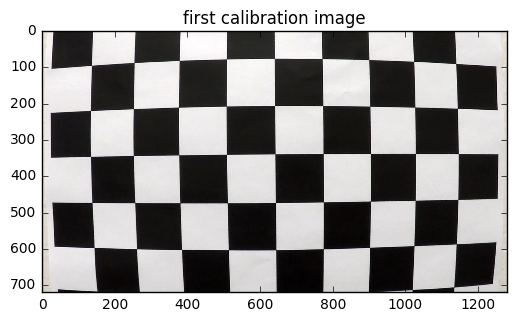

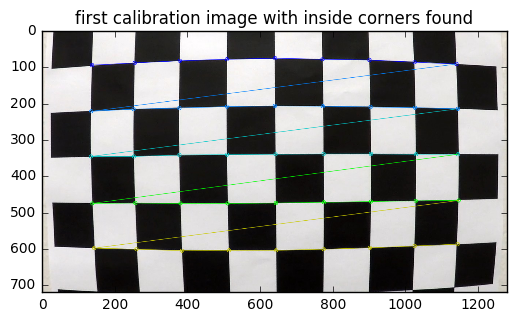

number of inside corners : (9, 5)


In [3]:
# Test chessboard corner finding algorithm in first calibration image

# import image as RGB
img = mpimg.imread('camera_cal/calibration1.jpg')

# display original image
plt.imshow(img)
plt.title('first calibration image')
plt.show()

# convert to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

# maximum number of inside corners in calibration images
# iterative algorithm will diminish the number if required
numChessMaxInsideCorners = (9, 6)

# find chessboard corners
ret, corners, numChessInsideCorners = findChessboardCornersIter(gray, numChessMaxInsideCorners)

# draw detected corners on image
if ret == True:
    img = cv2.drawChessboardCorners(img, numChessInsideCorners, corners, ret)
    plt.imshow(img)
    plt.title('first calibration image with inside corners found')
    plt.show()
    print('number of inside corners :', numChessInsideCorners)
else:
    print('no inside corners found')
    

## Find object and image calibration points

In [4]:
# Run the corner detection algorithm for all calibration images
# and create lists of object and image points

imageFileList = glob.glob('camera_cal/calibration*.jpg')

# Initialize lists of object and image points for calibration
objPoints = []
imgPoints = []

# maximum number of inside corners in calibration images
# iterative algorithm will diminish the number if required
numChessMaxInsideCorners = (9, 6)

# for each calibration image for which chess corners are found, calculate object and image points and append to list
for imageFile in imageFileList:
    
    # import image as RGB
    img = mpimg.imread(imageFile)

    # convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # find chessboard corners
    ret, corners, numChessInsideCorners = findChessboardCornersIter(gray, numChessMaxInsideCorners)

    # if corners found, calculate image points, and append object and image points to lists
    if ret == True:
        
        # object points given in reference frame with origin and XY on chessboard plane
        # note that objp is the same across images with same numChessInsideCorners, but not
        # across images with different numChessInsideCorners
        objp = np.zeros((np.prod(numChessInsideCorners), 3), np.float32)
        objp[:,:2] = np.mgrid[0:numChessInsideCorners[0], 0:numChessInsideCorners[1]].T.reshape(-1,2)
        
        objPoints.append(objp)
        imgPoints.append(corners)
        print("image "+imageFile+" :", np.prod(numChessInsideCorners), "calibration points found")
    else:
        print("image "+imageFile+" :", "no calibration points found")
        

image camera_cal\calibration1.jpg : 45 calibration points found
image camera_cal\calibration10.jpg : 54 calibration points found
image camera_cal\calibration11.jpg : 54 calibration points found
image camera_cal\calibration12.jpg : 54 calibration points found
image camera_cal\calibration13.jpg : 54 calibration points found
image camera_cal\calibration14.jpg : 54 calibration points found
image camera_cal\calibration15.jpg : 54 calibration points found
image camera_cal\calibration16.jpg : 54 calibration points found
image camera_cal\calibration17.jpg : 54 calibration points found
image camera_cal\calibration18.jpg : 54 calibration points found
image camera_cal\calibration19.jpg : 54 calibration points found
image camera_cal\calibration2.jpg : 54 calibration points found
image camera_cal\calibration20.jpg : 54 calibration points found
image camera_cal\calibration3.jpg : 54 calibration points found
image camera_cal\calibration4.jpg : no calibration points found
image camera_cal\calibration5

### Calibrate camera

In [5]:
# calibrate camera
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objPoints, imgPoints, gray.shape[::-1], None, None)

print("\nCamera calibrated.\n")
print("* distortion coefficients :\n", dist)
print("\n* camera matrix (intrinsic parameters) :\n", mtx)


Camera calibrated.

* distortion coefficients :
 [[ -2.50379078e-01   2.45817460e-02  -1.15041553e-03  -1.20660298e-04
   -1.09745277e-01]]

* camera matrix (intrinsic parameters) :
 [[  1.15994525e+03   0.00000000e+00   6.69068113e+02]
 [  0.00000000e+00   1.15682499e+03   3.91660935e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]


### Check calibration: undistort calibration images

C:\Users\ASUS\Anaconda3\envs\carnd-term1\lib\site-packages\matplotlib\pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


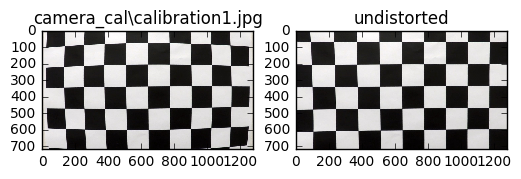

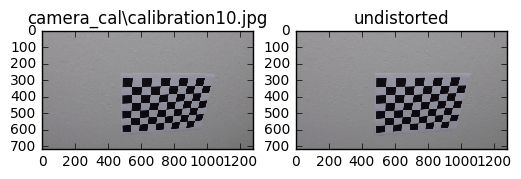

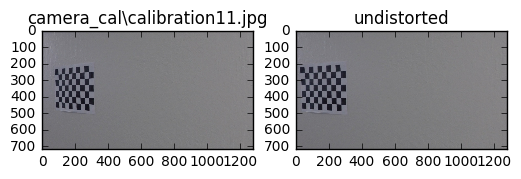

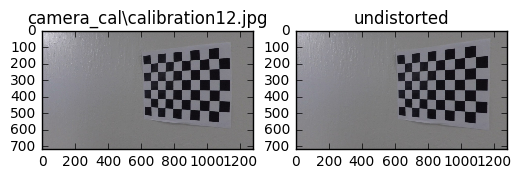

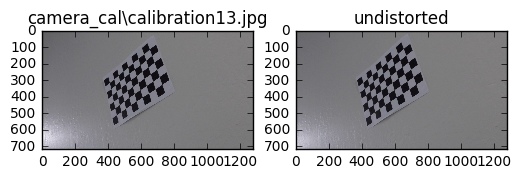

...

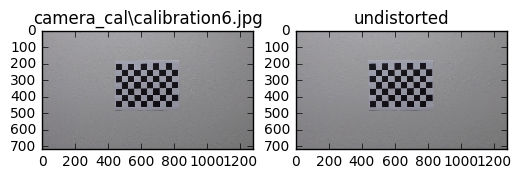

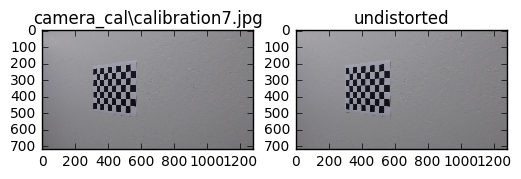

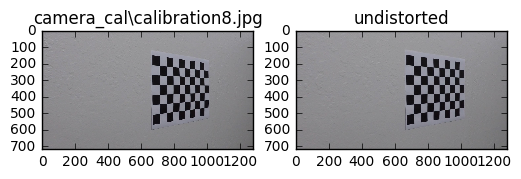

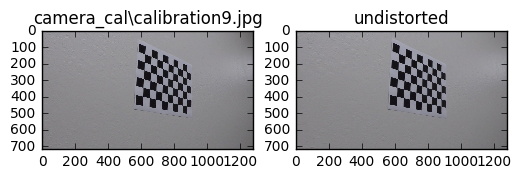

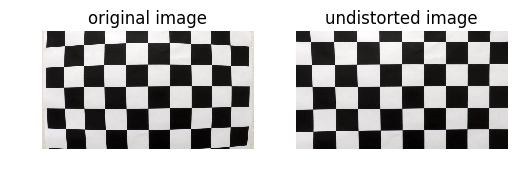

In [41]:
# show undistorted calibration images to check calibration

for imageFile in imageFileList:
    
    # import image as RGB
    img = mpimg.imread(imageFile)
    
    # undistort image
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    # Two subplots, unpack the axes array immediately
    f, (ax1, ax2) = plt.subplots(1, 2)
    ax1.imshow(img)
    ax1.set_title(imageFile)
    ax2.set_title('undistorted')
    ax2.imshow(dst)

    
# Save distorted and undistorted versions of first calibration image to disk
imageFile = imageFileList[0]

img = mpimg.imread(imageFile)
dst = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2)
ax1.axis('off')
ax2.axis('off')
ax1.imshow(img)
ax1.set_title('original image')
ax2.set_title('undistorted image')
ax2.imshow(dst)
plt.savefig('output_images/undistort_output.png', bbox_inches='tight')    


### Check calibration: undistort road images

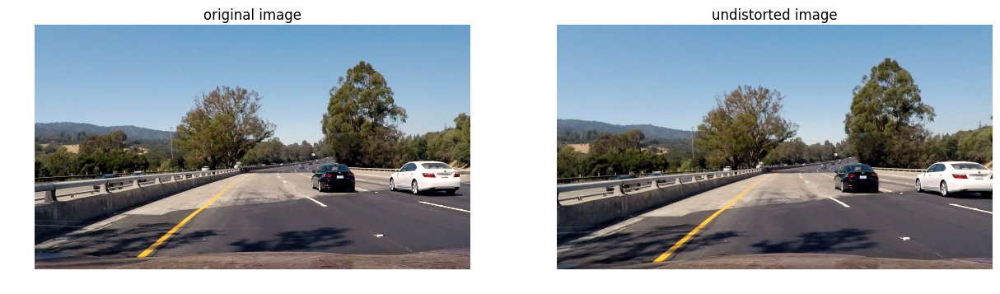

In [40]:
    imageFile = 'test_images/test4.jpg'
    
    # import image as RGB
    img = mpimg.imread(imageFile)
    
    # undistort image
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    
    # plot original and undistorted image, and save to disk
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,15))
    ax1.imshow(img)
    ax2.imshow(dst)
    ax1.set_title('original image')
    ax2.set_title('undistorted image')
    ax1.axis('off')
    ax2.axis('off')
    plt.savefig('output_images/test4_undistorted.jpg', bbox_inches='tight')
    

# 2. Pipeline (for isolated single images)

### 2.1. Explore color spaces and channels

(-0.5, 1279.5, 719.5, -0.5)

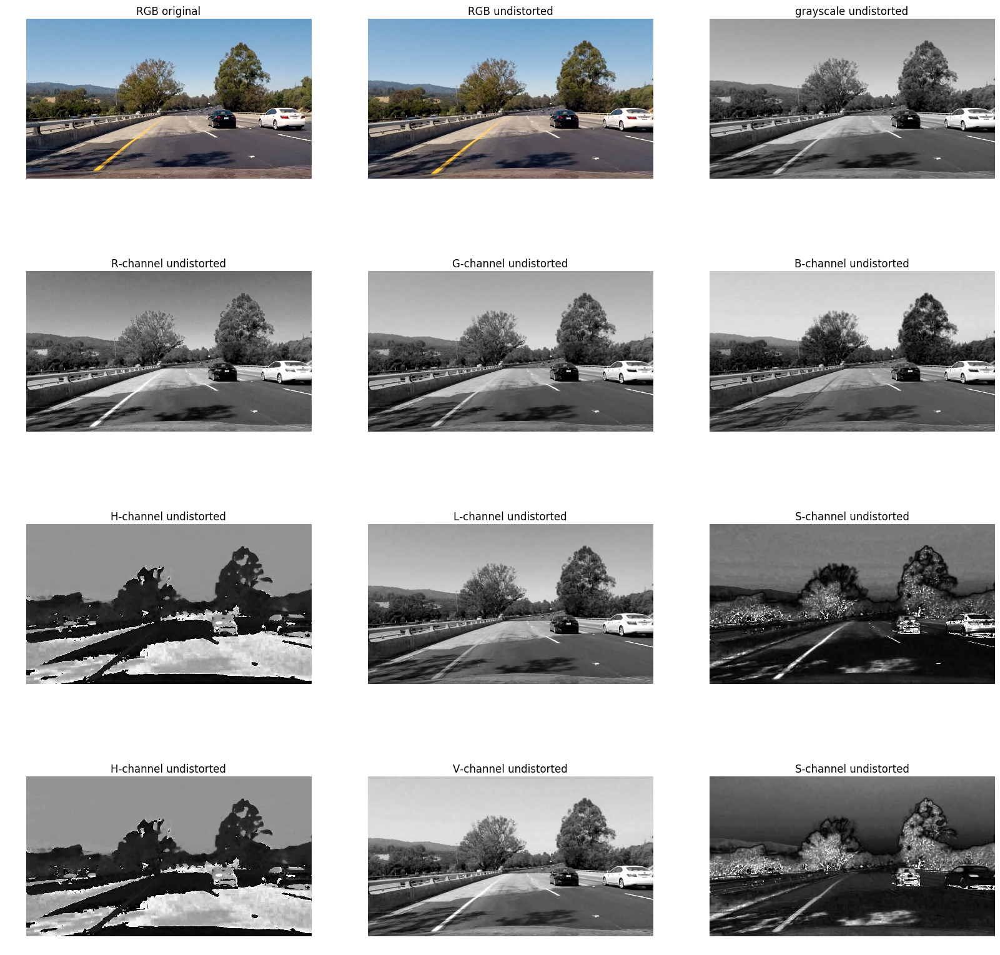

In [16]:
    imageFile = 'test_images/test4.jpg'
    
    # import image as RGB
    imgOrig = mpimg.imread(imageFile)
    
    # undistort image
    img = cv2.undistort(imgOrig, mtx, dist, None, mtx)
    
    # convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # convert to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    # convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
     # plot original undistorted image and binary mag_thresh mask
    f, ((ax1, ax2, ax3), (ax4, ax5, ax6), (ax7, ax8, ax9), (ax10, ax11, ax12)) = plt.subplots(4, 3, figsize=(20,20))
    
    ax1.imshow(imgOrig)
    ax1.set_title('RGB original')
    ax1.axis('off')
    ax2.imshow(img)
    ax2.set_title('RGB undistorted')
    ax2.axis('off')
    ax3.imshow(gray, cmap='gray')
    ax3.set_title('grayscale undistorted')
    ax3.axis('off')
    
    ax4.imshow(img[:,:,0], cmap='gray')
    ax4.set_title('R-channel undistorted')
    ax4.axis('off')
    ax5.imshow(img[:,:,1], cmap='gray')
    ax5.set_title('G-channel undistorted')
    ax5.axis('off')
    ax6.imshow(img[:,:,2], cmap='gray')
    ax6.set_title('B-channel undistorted')
    ax6.axis('off')
    
    ax7.imshow(hls[:,:,0], cmap='gray')
    ax7.set_title('H-channel undistorted')
    ax7.axis('off')
    ax8.imshow(hls[:,:,1], cmap='gray')
    ax8.set_title('L-channel undistorted')
    ax8.axis('off')
    ax9.imshow(hls[:,:,2], cmap='gray')
    ax9.set_title('S-channel undistorted')
    ax9.axis('off')

    ax10.imshow(hsv[:,:,0], cmap='gray')
    ax10.set_title('H-channel undistorted')
    ax10.axis('off')
    ax11.imshow(hsv[:,:,2], cmap='gray')
    ax11.set_title('V-channel undistorted')
    ax11.axis('off')
    ax12.imshow(hsv[:,:,1], cmap='gray')
    ax12.set_title('S-channel undistorted')
    ax12.axis('off')
    

### 2.2. Define several auxiliary functions for image thresholding based on colors and gradients

In [18]:

# Color thresholding of H and S channels in HLS color space
def hls_color_mask(imgRBG, h_thresh=(10,25), s_thresh=(90,255)):
    
    # convert image to HLS color space and extract channels
    hls = cv2.cvtColor(imgRBG, cv2.COLOR_RGB2HLS)
    H = hls[:,:,0]
    L = hls[:,:,1]
    S = hls[:,:,2]
    
    # initialize mask to zeros
    mask = np.zeros((imgRBG.shape[0], imgRBG.shape[1]), dtype=np.uint8)
    
    # appyl color thresholding
    mask[ ((H>h_thresh[0]) & (H<=h_thresh[1])) & ((S>s_thresh[0]) & (S<=s_thresh[1])) ] = 1

    return mask


# Gradient thresholding using gradient magnitude and direction
def grad_mask(imgGray, sobel_kernel_mag=5, sobel_kernel_dir=15, mag_thresh=(10,255), dir_thresh=(60.,90.)):
    
    # Calculate sobel gradient magnitude
    sobelx = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 1, 0, ksize=sobel_kernel_mag) )
    sobely = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 0, 1, ksize=sobel_kernel_mag) )
    sobelMag = np.sqrt(np.square(sobelx)+np.square(sobely))
    sobelMag = np.uint8( 255*sobelMag/sobelMag.max() )  # normalize to 0-255 and convert to unit
    
    # Calculate sobel gradient direction
    sobelx = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 1, 0, ksize=sobel_kernel_dir) )
    sobely = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 0, 1, ksize=sobel_kernel_dir) )
    sobelDir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))*180/np.pi  # [deg]

    mask = np.zeros_like(sobelMag, dtype=np.uint8)
    
    # apply gradient magnitude and direction thresholding
    mask[ ((sobelMag>mag_thresh[0]) & (sobelMag<=mag_thresh[1])) & ((sobelDir>dir_thresh[0]) & (sobelDir<=dir_thresh[1])) ] = 1
    
    return mask


# Gradient thresholding using only gradient magnitude
def gradMag_mask(imgGray, sobel_kernel_mag=5, mag_thresh=(10,255)):
    
    # calculate sobel gradient magnitude
    sobelx = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 1, 0, ksize=sobel_kernel_mag) )
    sobely = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 0, 1, ksize=sobel_kernel_mag) )
    sobelMag = np.sqrt(np.square(sobelx)+np.square(sobely))
    sobelMag = np.uint8( 255*sobelMag/sobelMag.max() )  # normalize to 0-255 and convert to unit

    mask = np.zeros_like(sobelMag, dtype=np.uint8)
    
    # apply gradient magnitude thresholding
    mask[ (sobelMag>mag_thresh[0]) & (sobelMag<=mag_thresh[1]) ] = 1
    
    return mask


# Gradient thresholding using only gradient direction
def gradDir_mask(imgGray, sobel_kernel_dir=15, dir_thresh=(60.,90.)):
    
    # calculate sobel gradient direction
    sobelx = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 1, 0, ksize=sobel_kernel_dir) )
    sobely = np.absolute( cv2.Sobel(imgGray, cv2.CV_64F, 0, 1, ksize=sobel_kernel_dir) )
    sobelDir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))*180/np.pi  # [deg]

    mask = np.zeros_like(sobelDir, dtype=np.uint8)
    
    # apply gradient magnitude and direction thresholding
    mask[ (sobelDir>dir_thresh[0]) & (sobelDir<=dir_thresh[1]) ] = 1
    
    return mask


# Composition of HLS color thresholding and gradient magnitude thresholding to color mask
def image_color_gradMag_mask(imgRGB, h_thresh=(10,25), s_thresh=(90,255), sobel_kernel_mag=1, mag_thresh=(80,255)):
    mask = hls_color_mask(imgRGB, h_thresh, s_thresh)
    return gradMag_mask(mask, sobel_kernel_mag=5, mag_thresh=(10,255))


# Combined masking function. A pixel is selected if it is in either of the following masks:
#   1) composition of HLS color tresholding and gradient magnitude tresholding to color mask
#   2) gradient magnitude and direction thresholding to L color chanel
#
# This is the thresholding function used in the final pipeline
def combined_mask(imgRGB):
    
    # mask with thresholding of color and grad magnitude of H and S channels
    maskColorGradHS = image_color_gradMag_mask(imgRGB)
    
    # mask with thresholding of grad magnitude/direction of L-channel
    hls = cv2.cvtColor(imgRGB, cv2.COLOR_RGB2HLS)
    L = hls[:,:,1]
    maskGradL = grad_mask(L, sobel_kernel_mag=5, sobel_kernel_dir=15, mag_thresh=(40,255), dir_thresh=(0.,55.))
    
    return maskColorGradHS | maskGradL


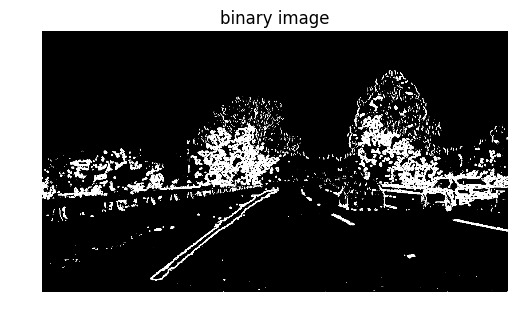

In [39]:
imageFile = 'test_images/test4.jpg'
    
# import image as RGB
img = mpimg.imread(imageFile)
    
# undistort image
dst = cv2.undistort(img, mtx, dist, None, mtx)
    
# apply combined_mask and save binary image to disk
img = combined_mask(img)

plt.imshow(img, cmap='gray')
plt.title('binary image')
plt.axis('off')
plt.savefig('output_images/test4_binary.jpg', bbox_inches='tight')


## 2.3. Perspective transform: bird's eye view

### Calculate perspective transform matrix

source point coordinates:
[[  577.           460.        ]
 [  196.33332825   720.        ]
 [ 1126.66662598   720.        ]
 [  705.           460.        ]]

dest point coordinates:
[[ 320.    0.]
 [ 320.  720.]
 [ 960.  720.]
 [ 960.    0.]]


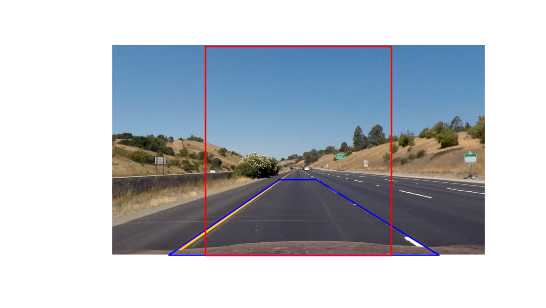

In [43]:
# Use a straight lines image to define the perspective transform
imageFile = 'test_images/straight_lines1.jpg'
    
# import image as RGB
img = mpimg.imread(imageFile)
    
# undistort image
img = cv2.undistort(img, mtx, dist, None, mtx)

# define source points
src = np.float32(
    [[img.shape[1]/2-63, img.shape[0]/2+100],
    [img.shape[1]/6-17, img.shape[0]],
    [img.shape[1]*5/6+60, img.shape[0]],
    [img.shape[1]/2+65, img.shape[0]/2+100]])

# define destination points
dst = np.float32(
    [[img.shape[1]/4, 0],
    [img.shape[1]/4, img.shape[0]],
    [img.shape[1]*3/4, img.shape[0]],
    [img.shape[1]*3/4, 0]])

print("source point coordinates:")
print(src)
print("\ndest point coordinates:")
print(dst)

# plot image
plt.imshow(img)

# plot source region
x, y = [p[0] for p in src], [p[1] for p in src]
x.append(src[0][0])
y.append(src[0][1])
plt.plot(x,y)

# plot destination region
x, y = [p[0] for p in dst], [p[1] for p in dst]
x.append(dst[0][0])
y.append(dst[0][1])
plt.plot(x,y, 'r')

plt.axis('off')
plt.show()

# calculate perspective transforms
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)  # inverse


### Apply perspective transform to test image

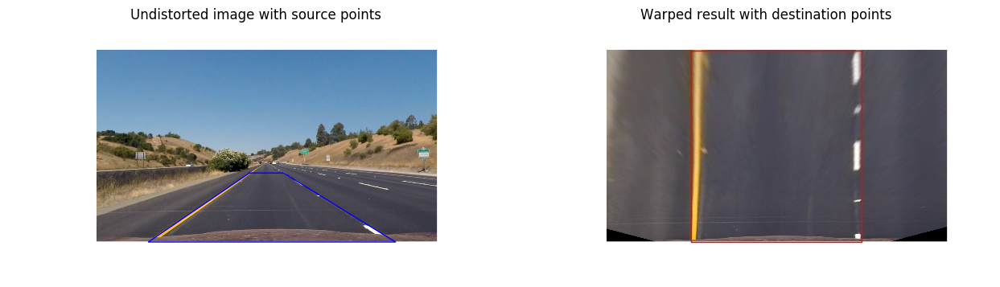

In [58]:
# Perform perspective transform

# Use a straight lines image to define the perspective transform
imageFile = 'test_images/straight_lines1.jpg'
    
# import image as RGB
img = mpimg.imread(imageFile)
    
# undistort image
img = cv2.undistort(img, mtx, dist, None, mtx)


warped = cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,15))

# plot source image
ax1.imshow(img)

# plot source region
x, y = [p[0] for p in src], [p[1] for p in src]
x.append(src[0][0])
y.append(src[0][1])
ax1.plot(x,y)
ax1.axis('off')

# plot warped image
ax2.imshow(warped)

# plot destination region
x, y = [p[0] for p in dst], [p[1] for p in dst]
x.append(dst[0][0])
y.append(dst[0][1])
ax2.plot(x,y, 'r')
ax2.axis('off')

ax1.set_title('Undistorted image with source points')
ax2.set_title('Warped result with destination points')

plt.savefig('output_images/straight_lines1_warped.jpg', bbox_inches='tight')

## 2.4. Combinations of binary thresholding and perspective transform

### Approach 1: warp first, then apply thresholding

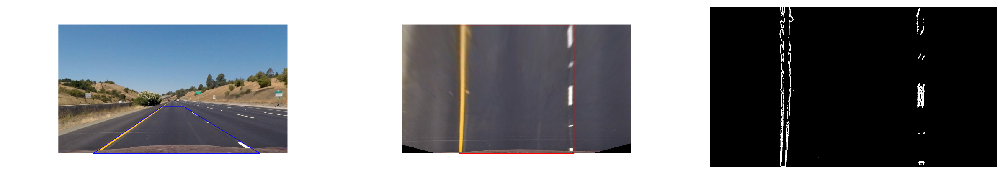

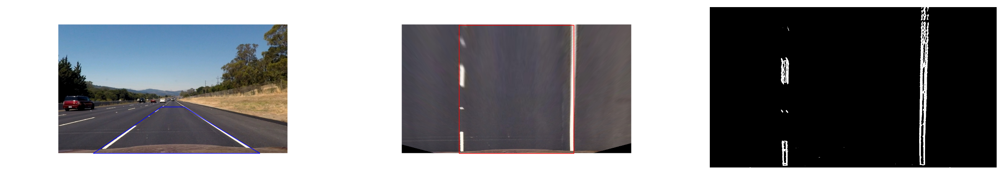

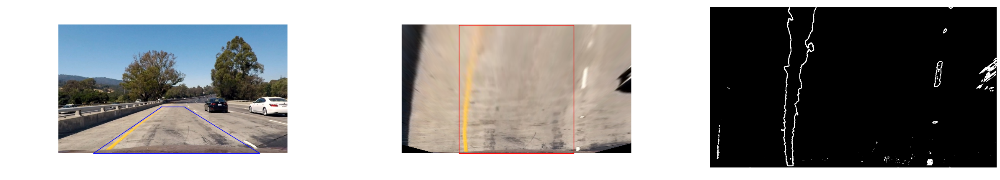

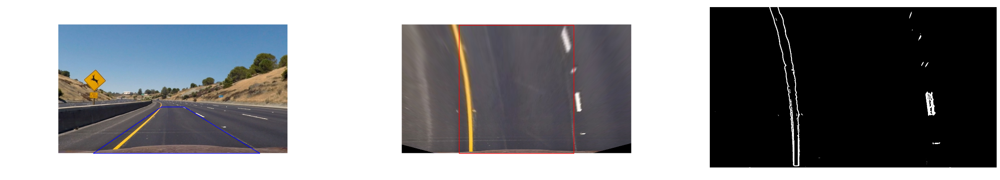

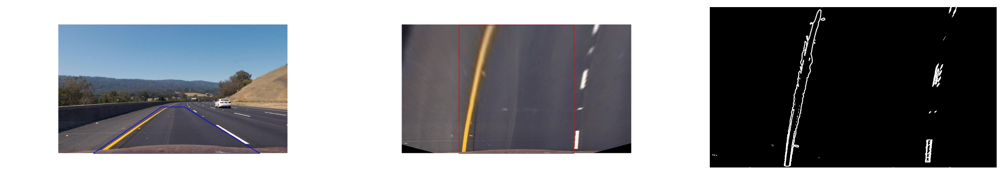

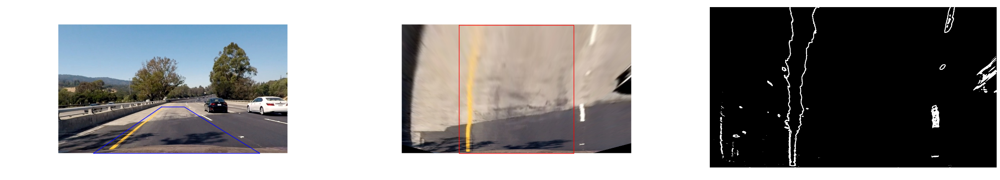

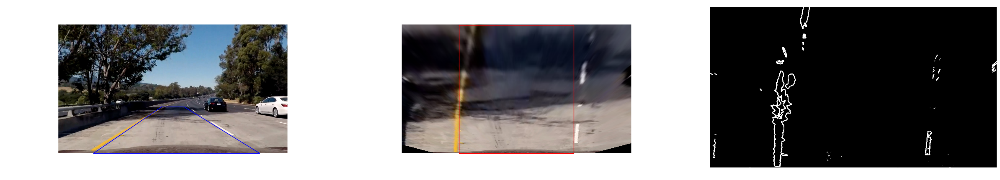

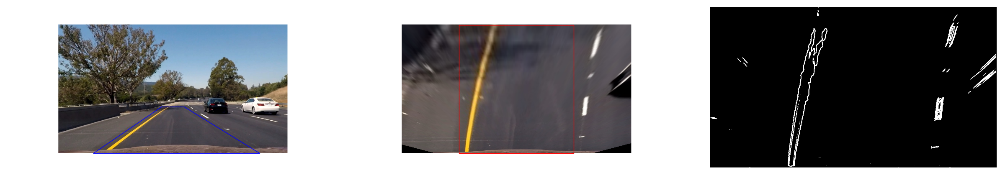

In [45]:
# Perform perspective transform

imageFileList = glob.glob('test_images/*.jpg')

for imageFile in imageFileList:

    # import image as RGB
    img = mpimg.imread(imageFile)
    
    # undistort image
    img = cv2.undistort(img, mtx, dist, None, mtx)

    # warp image perspective
    warped = cv2.warpPerspective(img, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

    # create subplots figure
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30,15))

    # plot source image
    ax1.imshow(img)

    # plot source region
    x, y = [p[0] for p in src], [p[1] for p in src]
    x.append(src[0][0])
    y.append(src[0][1])
    ax1.plot(x,y)
    ax1.axis('off')

    # plot warped image
    ax2.imshow(warped)

    # plot destination region
    x, y = [p[0] for p in dst], [p[1] for p in dst]
    x.append(dst[0][0])
    y.append(dst[0][1])
    ax2.plot(x,y, 'r')
    ax2.axis('off')
    
    mask = combined_mask(warped)
    ax3.imshow(mask, cmap='gray')
    ax3.axis('off')

### Approach 2 (selected): apply thresholding first, then warp
#### ---This is the approach selected for the final pipeline

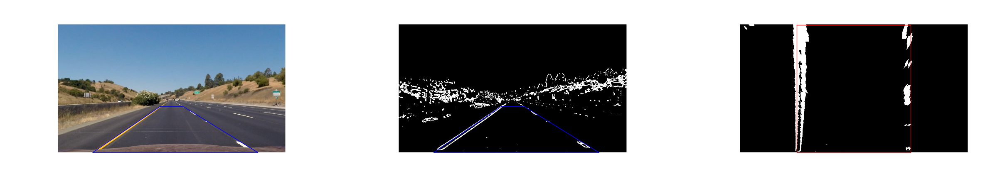

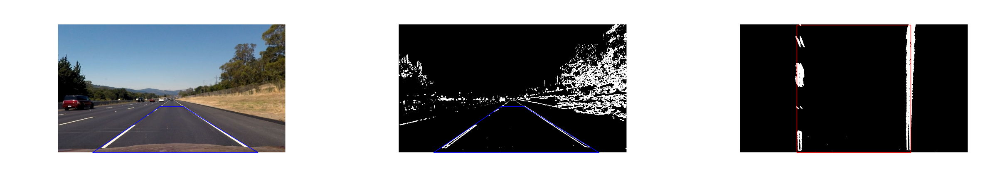

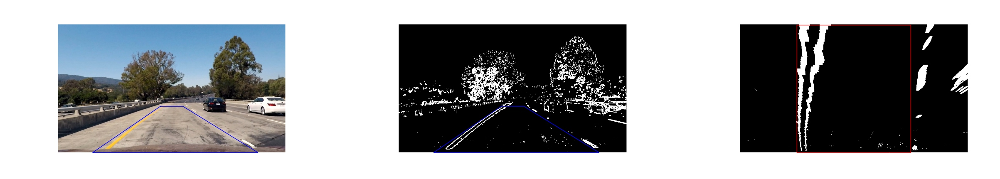

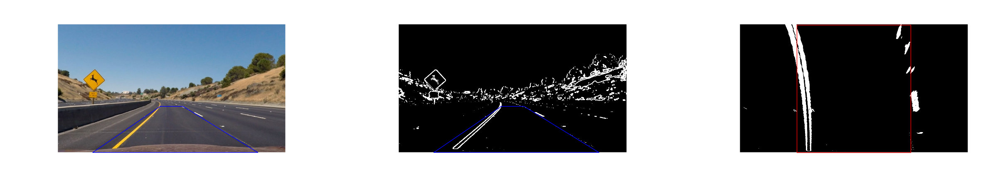

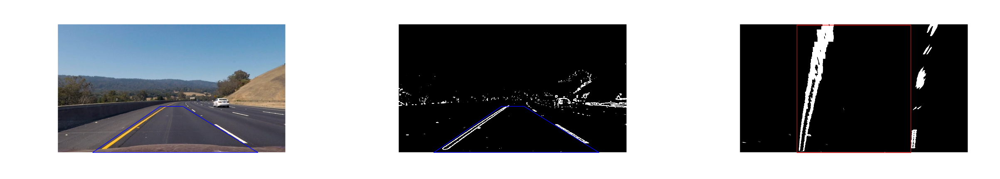

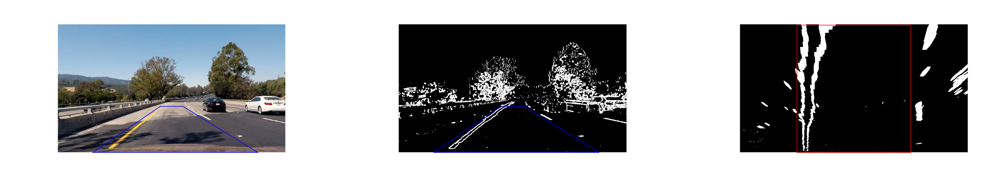

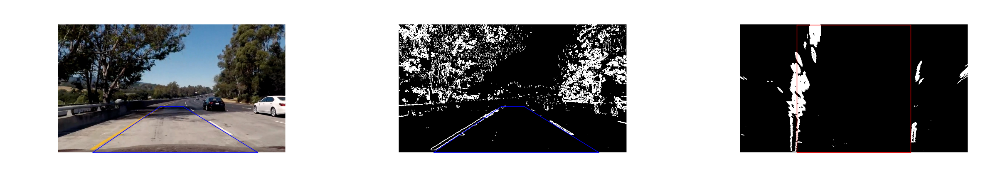

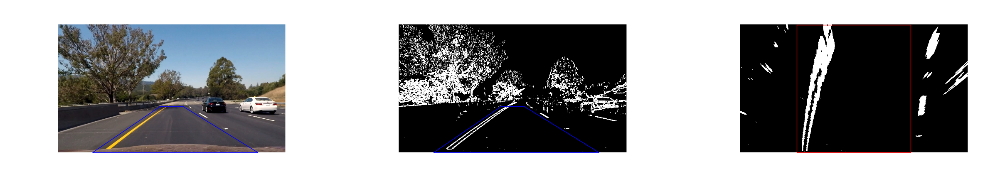

In [46]:
# Perform perspective transform

imageFileList = glob.glob('test_images/*.jpg')

for imageFile in imageFileList:

    # import image as RGB
    img = mpimg.imread(imageFile)
    
    # undistort image
    img = cv2.undistort(img, mtx, dist, None, mtx)

    # apply color and gradient thresholding
    mask = combined_mask(img)
    
    # warp image perspective
    warped = cv2.warpPerspective(mask, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)
    
    # apply gradient direction thresholding
    #warpedDirThr = grad_mask(warped, sobel_kernel_mag=1, sobel_kernel_dir=15, mag_thresh=(-1,300), dir_thresh=(0.,35.))
    
    # create subplots figure
    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(30,15))

    # plot source image
    ax1.imshow(img)

    # plot source region
    x, y = [p[0] for p in src], [p[1] for p in src]
    x.append(src[0][0])
    y.append(src[0][1])
    ax1.plot(x,y)
    ax1.axis('off')

    # plot thresholding mask
    ax2.imshow(mask, cmap='gray')

    # plot source region
    x, y = [p[0] for p in src], [p[1] for p in src]
    x.append(src[0][0])
    y.append(src[0][1])
    ax2.plot(x,y)
    ax2.axis('off')
    
    ax3.imshow(warped, cmap='gray')
    ax3.axis('off')
    
    # plot destination region
    x, y = [p[0] for p in dst], [p[1] for p in dst]
    x.append(dst[0][0])
    y.append(dst[0][1])
    ax3.plot(x,y, 'r')
    ax3.axis('off')
    

## 2.5. Find lanes and calculate radius of curvature and offset

### 2.5.1. Define class to store lane information

In [48]:
class Lane():
    def __init__(self, imgshape):
        
        # flat to indicate whether lane line points search in next ineration shall be done from lost state
        self.searchFromLostState = True
        
        # number of cycles since last valid lane detection
        self.numCyclesWithoutDetection = 0
        
        # coordinates of last lane lines correctly detected
        #self.yList =  np.linspace(0, imgshape[0], num=imgshape[0])
        self.yList = []
        self.xListL = []
        self.xListR = []
        
        # radius of curvature and transversal road offset last time lane was correctly identified
        self.radCurvL = 5000.
        self.radCurvR = 5000.
        self.xoffset = 0.

### 2.5.2. Indentify lane line points with sliding-window method

In [57]:

# Find points belonging to left and right lane in input mask, starting from previous state ------------------

def find_points_in_lanes_from_prevState(mask, windowXsize, lane):

    # list of points in left and right lane lines
    pointsLeft = []
    pointsRight = []

    # intialize loop variables
    imgshape = mask.shape
    i0 = imgshape[0]
    
    for i in range(len( lane.yList )):
        
        # left line
        for j in range( max(0,int(lane.xListL[i])-windowXsize//2), min(imgshape[1]-1,int(lane.xListL[i])+windowXsize//2) ):
            if mask[i,j]==1:
                pointsLeft.append([j, i])
        # right line
        for j in range( max(0,int(lane.xListR[i])-windowXsize//2), min(imgshape[1]-1,int(lane.xListR[i])+windowXsize//2) ):
            if mask[i,j]==1:
                pointsRight.append([j, i])
    
    # return lists as numpy arrays of uint
    return np.uint(pointsLeft), np.uint(pointsRight)



# Identify which pixels with value 1 in input mask belong to left and right lane lines
# Initial guesses of position of lane line centres at the bottom of the image are given as xLbottom and xRbottom
# This function is to be used by find_points_in_lanes_from_lostState after estimating xLbottom and xRbottom

def find_points_in_lanes(mask, xLbottom, xRbottom, windowXsize = 200, windowYsize = 100):

    # list of points in left and right lane lines
    pointsLeft = []
    pointsRight = []

    # intialize loop variables
    imgshape = mask.shape
    i0 = imgshape[0]

    # start at bottom of lanes in image and ascend with each iteration
    jLCenter = xLbottom
    jRCenter = xRbottom
    
    while i0 > 0:
    
        # define lane window corners
        i0 = max(i0-windowYsize, 0)
        i1 = i0+windowYsize
        jL0 = max(0, jLCenter-windowXsize//2)
        jL1 = min(imgshape[1], jLCenter+windowXsize//2)
        jR0 = max(0, jRCenter-windowXsize//2)
        jR1 = min(imgshape[1], jRCenter+windowXsize//2)
        
        # append to lists points within left and right lane windows
        for i in range(i0,i1):
            for j in range(jL0,jL1):
                if mask[i,j]==1:
                    pointsLeft.append([j, i])
            for j in range(jR0,jR1):
                if mask[i,j]==1:
                    pointsRight.append([j, i])

        # for left and right lane windows, construct histogram and find X of lanes centre
        # if no points inside window, keep previous X-value of lane centre
    
        # left lane
        histogram = np.sum(mask[i0:i1, jL0:jL1], axis=0)
        if np.sum(histogram)>0:
            jLCenter = int( jL0 + np.average(np.arange(0,len(histogram)), weights=histogram) )
    
        # right lane
        histogram = np.sum(mask[i0:i1, jR0:jR1], axis=0)
        if np.sum(histogram)>0:
            jRCenter = int( jR0 + np.average(np.arange(0,len(histogram)), weights=histogram) )

    # return lists as numpy arrays of uint
    return np.uint(pointsLeft), np.uint(pointsRight)



# Find points belonging to left and right lane in input mask, starting from lost state ------------------

def find_points_in_lanes_from_lostState(warped, windowXsize=100, windowYsize=100, bottomFindLineMethod="max"):
    
    # calculate x-value of left and right lane lines at bottom of image
    # use different method depending on input ("max" or "wavg")
    imgshape = warped.shape
    
    if bottomFindLineMethod == "max":
    
        histogram = np.sum(warped[int(0.6*imgshape[0]):,:], axis=0)

        # left lane
        xLbottom = np.argmax( histogram[0:imgshape[1]//2] )
        #if xLbottom == 0:
        #    print('error: left lane line not found at 40% bottom section of image')
        #    plt.imshow(warped, cmap='gray')
        #    plt.show()
        #    return [], []
        # right lane
        xRbottom = np.argmax( histogram[imgshape[1]//2:] ) + imgshape[1]//2
        #if xRbottom == imgshape[1]//2:
        #    print('error: right lane line not found at 40% bottom section of image')
        #    plt.imshow(warped, cmap='gray')
        #    plt.show()
        #    return [], []
    
    else:
    
        # left lane
        histogram = np.sum(warped[int(0.6*imgshape[0]):,:imgshape[1]//2], axis=0)
        if np.sum(histogram)>0:
            xLbottom = int( np.average(np.arange(0,len(histogram)), weights=histogram) )
        else:
            print('error: left lane line not found at 40% bottom section of image')
            plt.imshow(warped, cmap='gray')
            plt.show()
            return [], []
        # right lane
        histogram = np.sum(warped[int(0.6*imgshape[0]):,imgshape[1]//2:], axis=0)
        if np.sum(histogram)>0:
            xRbottom = int( imgshape[1]//2 + np.average(np.arange(0,len(histogram)), weights=histogram) )
        else:
            print('error: right lane line not found at 40% bottom section of image')
            plt.imshow(warped, cmap='gray')
            plt.show()
            return [], []
    
    # identify points belonging to left and right lane lines
    pointsLeft, pointsRight = find_points_in_lanes(warped, xLbottom, xRbottom, windowXsize, windowYsize)
    
    return pointsLeft, pointsRight


### 2.5.3. Fit lines to points and calculate radius of curvature and x-offset (for isolated image)

In [74]:
# Fit 2nd order polynominals to poinst on left and right lane lines,
# calculate fit curves curvature at the bottom of the image, and return
# discretizations of the fits and radii of curvature
def fit_lane_points_and_calc_curvature(pointsLeft, pointsRight, imgshape):

    # fit 2nd order polynominals to points in left and right lane lines, in pixel space
    fitLeft = np.polyfit(pointsLeft.T[1], pointsLeft.T[0], 2)
    fitRight = np.polyfit(pointsRight.T[1], pointsRight.T[0], 2)

    # define conversions in x and y from pixels space to meters
    mPerPixelY = 30/720   # meters per pixel in y dimension
    mPerPixelX = 3.7/640  # meters per pixel in x dimension

    # fit 2nd order polynominals to points in left and right lane lines, in meters
    fitLeftM = np.polyfit(pointsLeft.T[1]*mPerPixelY, pointsLeft.T[0]*mPerPixelX, 2)
    fitRightM = np.polyfit(pointsRight.T[1]*mPerPixelY, pointsRight.T[0]*mPerPixelX, 2)

    # calculate radii of curvature
    radCurvLeft = ( 1 + (2*fitLeftM[0]*imgshape[0]*mPerPixelY + fitLeftM[1])**2 )**1.5 / np.absolute(2*fitLeftM[0])
    radCurvRight = ( 1 + (2*fitRightM[0]*imgshape[0]*mPerPixelY + fitRightM[1])**2 )**1.5 / np.absolute(2*fitRightM[0])
    
    # generate data list to plot fit curves
    yList = np.linspace(0, imgshape[0], num=imgshape[0])
    xListL = fitLeft[0]*yList**2 + fitLeft[1]*yList + fitLeft[2]
    xListR = fitRight[0]*yList**2 + fitRight[1]*yList + fitRight[2]
    
    # calculate vehicle offset from centre in m
    xoffset = 0.5*mPerPixelX*(xListL[-1] + xListR[-1] - imgshape[1])
    
    return yList, xListL, xListR, radCurvLeft, radCurvRight, xoffset



# Fit 2nd order polynominals to poinst on left and right lane lines,
# constraining the curvature of left lane line to match the curvature
# of right lane line for all value of y, i.e. find parameters
# A, B, CL and CR s.t. quadratic models:
#  x = A*y**2 + B*y + CL  for left lane
#  x = A*y**2 + B*y + CR  for right lane
# best approximate input points in a least-squares sense.
#
# Then, calculate fit curves curvature at the bottom of the image, xoffset, and return
# discretizations of the fits, radii of curvature and xoffset
def fit_parall_lane_points_and_calc_curvature(pointsLeft, pointsRight, imgshape):

    nLeft = len(pointsLeft)
    nRight = len(pointsRight)
    
    # Calculate best fit in pixel space -----------------------------
    
    A = np.empty((nLeft+nRight,4), dtype=np.float64)
    x = np.empty(nLeft+nRight, dtype=np.float64)
    
    # add data points of left lane
    for i in range(nLeft):
        A[i] = [pointsLeft[i,1]**2, pointsLeft[i,1], 1., 0.]
        x[i] = pointsLeft[i,0]
    
    # add data points of right lane
    for i in range(nRight):
        A[nLeft+i] = [pointsRight[i,1]**2, pointsRight[i,1], 0., 1.]
        x[nLeft+i] = pointsRight[i,0]
    
    # calculate model coefficients with A pseudoinverse
    coeff = np.dot( np.linalg.pinv(A), x )
    a, b, cL, cR = coeff[0], coeff[1], coeff[2], coeff[3]
    
    # generate data list to plot fit curves
    yList = np.linspace(0, imgshape[0], num=imgshape[0])
    xListL = a*yList**2 + b*yList + cL
    xListR = a*yList**2 + b*yList + cR
    
    
    # Calculate best fit in distance space [m] -----------------------------

    # define conversions in x and y from pixels space to meters
    mPerPixelY = 30/720   # meters per pixel in y dimension
    mPerPixelX = 3.7/640  # meters per pixel in x dimension
    
    pointsLeftMod = np.float64(pointsLeft)
    pointsRightMod = np.float64(pointsRight)
    pointsLeftMod[:,0] *= mPerPixelX
    pointsRightMod[:,0] *= mPerPixelX
    pointsLeftMod[:,1] *= mPerPixelY
    pointsRightMod[:,1] *= mPerPixelY    
    
    # add data points of left lane
    for i in range(nLeft):
        A[i] = [pointsLeftMod[i,1]**2, pointsLeftMod[i,1], 1., 0.]
        x[i] = pointsLeftMod[i,0]
    
    # add data points of right lane
    for i in range(nRight):
        A[nLeft+i] = [pointsRightMod[i,1]**2, pointsRightMod[i,1], 0., 1.]
        x[nLeft+i] = pointsRightMod[i,0]
    
    # calculate model coefficients with A pseudoinverse
    coeff = np.dot( np.linalg.pinv(A), x )
    a, b, cL, cR = coeff[0], coeff[1], coeff[2], coeff[3]
    
    # calculate radius of curvature at closest point
    radCurv = ( 1 + (2*a*imgshape[0]*mPerPixelY + b)**2 )**1.5 / np.absolute(2*a)
    
    # calculate vehicle offset from centre in m
    xoffset = 0.5*mPerPixelX*(xListL[-1] + xListR[-1] - imgshape[1])
    
    return yList, xListL, xListR, radCurv, radCurv, xoffset


#### Test find_points_in_lanes_from_lostState

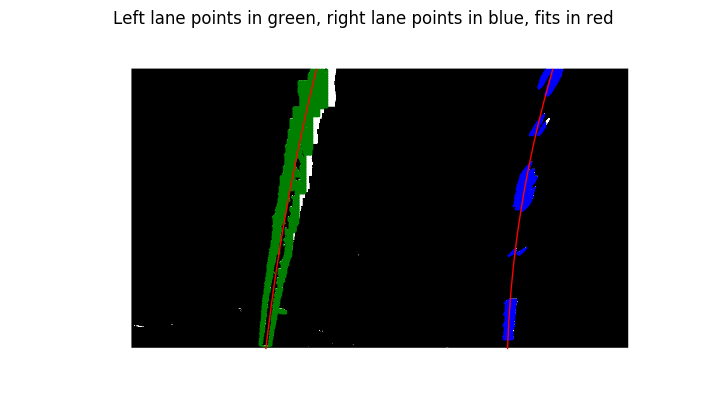

In [79]:
imageFile = 'test_images/test3.jpg'

img = mpimg.imread(imageFile)
img = cv2.undistort(img, mtx, dist, None, mtx)

mask = combined_mask(img)
warped = cv2.warpPerspective(mask, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

pointsLeft, pointsRight = find_points_in_lanes_from_lostState(warped)

yList, xListL, xListR, radCurvLeft, radCurvRight, xoffset = fit_lane_points_and_calc_curvature(
    pointsLeft, pointsRight, mask.shape)

plt.figure(figsize=(8,8))
plt.imshow(warped, cmap='gray')
plt.scatter([p[0] for p in pointsLeft], [p[1] for p in pointsLeft], s=1, facecolor='green', lw=0)
plt.scatter([p[0] for p in pointsRight], [p[1] for p in pointsRight], s=1, facecolor='blue', lw=0)
plt.plot(xListL, yList, 'r')
plt.plot(xListR, yList, 'r')
plt.title("Left lane points in green, right lane points in blue, fits in red")
plt.axis('off')
plt.savefig('output_images/test3_fitLaneLines.jpg', bbox_inches='tight')


### 2.5.4. Fit lines to points and calculate radius of curvature and x-offset, then perform sanity checks
#### (considering estimations in previous cycles)

In [82]:
def calc_curvAndOffset_and_sanityChecks(
        pointsLeft, pointsRight, lane, imgshape,
        weightNewEstim=0.2, numCyclesLostForRestart=10, forceSameCurv=True):
    
    laneOut = copy.copy(lane)
    
    # if no points are provided, flag estimation as invalid and return ------------
    if len(pointsLeft)==0 or len(pointsRight)==0:
        laneOut.numCyclesWithoutDetection +=1  
        if laneOut.numCyclesWithoutDetection >= numCyclesLostForRestart:
            laneOut.searchFromLostState = True
        return laneOut
    
    # else, start by calculating lane region, rad curv and xoffset for this image in isolation
    if forceSameCurv:
        yList, xListL, xListR, radCurvL, radCurvR, xoffset = fit_parall_lane_points_and_calc_curvature(
            pointsLeft, pointsRight, imgshape)
    else:
        yList, xListL, xListR, radCurvL, radCurvR, xoffset = fit_lane_points_and_calc_curvature(
            pointsLeft, pointsRight, imgshape)
    
    # perform sanity checks
    mPerPixelX = 3.7/640  # meters per pixel in x dimension
    laneWidthBottom = mPerPixelX*(xListR[-1] - xListL[-1])
    laneWidthTop = mPerPixelX*(xListR[0] - xListL[0])

    # if lane width and curvature values are reasonable, lane lines are approx. parallel,
    # and radius of curvature and offset are within 70% of last valid estimation
    # consider this estimation as valid
    if ( laneWidthBottom>2.5 and laneWidthBottom<4.5
        and laneWidthTop>1.0 and laneWidthTop<4.5
        and radCurvL>200 and radCurvR>200 and abs(min(radCurvL,4000)/min(radCurvR,4000)-1)<2.0
        and (lane.searchFromLostState or abs(min(radCurvL,4000)/min(lane.radCurvL,4000)-1)<0.7)
        and (lane.searchFromLostState or abs(min(radCurvR,4000)/min(lane.radCurvR,4000)-1)<0.7)
        and (lane.searchFromLostState or abs(max(xoffset,0.1)/max(lane.xoffset,0.1)-1)<0.3) ):

        # update lane parameters after applying filter
       
        laneOut.numCyclesWithoutDetection = 0
        laneOut.searchFromLostState = False
        
        if len(laneOut.yList)==0:
            laneOut.yList = yList
        
        if not lane.searchFromLostState:
            
            #print("valid estimation from previous state")
                     
            laneOut.radCurvL = weightNewEstim*radCurvL + (1-weightNewEstim)*lane.radCurvL
            laneOut.radCurvR = weightNewEstim*radCurvR + (1-weightNewEstim)*lane.radCurvR
            laneOut.xoffset = weightNewEstim*xoffset + (1-weightNewEstim)*lane.xoffset
            
            laneOut.xListL = weightNewEstim*xListL + (1-weightNewEstim)*lane.xListL
            laneOut.xListR = weightNewEstim*xListR + (1-weightNewEstim)*lane.xListR
            
        else:
            
            #print("valid estimation from lost state")
            
            laneOut.radCurvL = radCurvL
            laneOut.radCurvR = radCurvR
            laneOut.xoffset = xoffset
        
            laneOut.xListL = xListL
            laneOut.xListR = xListR
        
        
    # else, estimation is flagged as invalid and lane parameters are left unchanged
    else:
        
        laneOut.numCyclesWithoutDetection +=1
              
        if laneOut.numCyclesWithoutDetection >= numCyclesLostForRestart:
            laneOut.searchFromLostState = True

    return laneOut

### 2.5.5. Color unwarped lane region in image 

In [83]:

def plot_lanes(imgRGB, yList, xListL, xListR, Minv):

    imgshape = imgRGB.shape
    
    # create an image to draw the lines on
    color_warp = np.zeros_like(imgRGB, dtype=np.uint8)

    # recast the x and y points into usable format for cv2.fillPoly()
    pts = np.vstack((
        np.dstack((xListL,yList))[0],
        np.flipud( np.dstack((xListR,yList))[0] ) ))

    # draw the lane onto the warped blank image, in green
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255,0))

    # warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (imgshape[1], imgshape[0]))

    # combine the result with the original image
    return cv2.addWeighted(imgRGB, 1, newwarp, 0.3, 0)


### 2.5.6. Complete pipeline for an isolated image

In [84]:

def process_image_isolated(imgRGB, mtx, dist, M, Minv,
            h_thresh=(10,25), s_thresh=(90,255), sobel_kernel_mag=3, mag_thresh=(80,255),
            sobel_kernel_dir=7, dir_thresh=(0.,40.), windowXsize=200, windowYsize=100, bottomFindLineMethod="max", debugInfo=False ):
    
    # undistort image
    img = cv2.undistort(imgRGB, mtx, dist, None, mtx)
    
    # apply thresholding on unwarped image
    mask = combined_mask(img)
    
    # warp image perspective
    warped = cv2.warpPerspective(mask, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

    # apply gradient-direction thresholding on warped binary mask
    warped = gradDir_mask(warped, sobel_kernel_dir, dir_thresh)
    
    # calculate x-value of left and right lane lines at bottom of image
    # use different method depending on input ("max" or "wavg")
    imgshape = warped.shape
    
    if bottomFindLineMethod == "max":
    
        histogram = np.sum(warped[int(0.6*imgshape[0]):,:], axis=0)

        # left lane
        xLbottom = np.argmax( histogram[0:imgshape[1]//2] )
        if xLbottom == 0:
            print('error: left lane line not found at 40% bottom section of image')
            plt.imshow(warped, cmap='gray')
            plt.show()
            return 0., 0., img
        # right lane
        xRbottom = np.argmax( histogram[imgshape[1]//2:] ) + imgshape[1]//2
        if xRbottom == imgshape[1]//2:
            print('error: right lane line not found at 40% bottom section of image')
            plt.imshow(warped, cmap='gray')
            plt.show()
            return 0., 0., img
    
    else:
    
        # left lane
        histogram = np.sum(warped[int(0.6*imgshape[0]):,:imgshape[1]//2], axis=0)
        if np.sum(histogram)>0:
            xLbottom = int( np.average(np.arange(0,len(histogram)), weights=histogram) )
        else:
            print('error: left lane line not found at 40% bottom section of image')
            plt.imshow(warped, cmap='gray')
            plt.show()
            return 0., 0., img
        # right lane
        histogram = np.sum(warped[int(0.6*imgshape[0]):,imgshape[1]//2:], axis=0)
        if np.sum(histogram)>0:
            xRbottom = int( imgshape[1]//2 + np.average(np.arange(0,len(histogram)), weights=histogram) )
        else:
            print('error: right lane line not found at 40% bottom section of image')
            plt.imshow(warped, cmap='gray')
            plt.show()
            return 0., 0., img
    
    # identify points belonging to left and right lane lines
    pointsLeft, pointsRight = find_points_in_lanes(warped, xLbottom, xRbottom, windowXsize, windowYsize)
    
    # fit 2nd order polynominals to poinst on left and right lane lines
    # and calculate radii of curvature in [m]
    yList, xListL, xListR, radCurvLeft, radCurvRight = fit_lane_points_and_calc_curvature(pointsLeft, pointsRight, imgshape)
    #yList, xListL, xListR, radCurvLeft, radCurvRight, xoffset = fit_parall_lane_points_and_calc_curvature(pointsLeft, pointsRight, imgshape)
    
    if debugInfo:
        # plot points belonging to each lane line and polynominal fits to points
        plt.imshow(warped, cmap='gray')
        plt.scatter([p[0] for p in pointsLeft], [p[1] for p in pointsLeft], s=1, facecolor='green', lw=0)
        plt.scatter([p[0] for p in pointsRight], [p[1] for p in pointsRight], s=1, facecolor='blue', lw=0)
        plt.plot(xListL, yList, 'r')
        plt.plot(xListR, yList, 'r')
        plt.title("Left lane points in green, right lane points in blue, fits in red")
        plt.show()
    
    # color detected lane on undistorted RGB image
    imgLanes = plot_lanes(img, yList, xListL, xListR, Minv)
    
    return 0.5*(radCurvLeft+radCurvRight), xoffset, imgLanes

### 2.5.7. Complete pipeline using estimates from previous cycles
#### (this is the pipeline used for the final video processing)

In [85]:
# Perform an image processing cycle ---------------------------------------------------------------------

def process_image(imgRGB, mtx, dist, M, Minv,
            h_thresh=(10,25), s_thresh=(90,255), sobel_kernel_mag=3, mag_thresh=(80,255),
            sobel_kernel_dir=7, dir_thresh=(0.,40.), windowXsize=100, windowYsize=100,
            bottomFindLineMethod="max", debugInfo=False, forceSameCurv=True ):
    
    # undistort image
    img = cv2.undistort(imgRGB, mtx, dist, None, mtx)
    
    # apply combined color/gradient thresholding on unwarped image
    mask = combined_mask(img)
        
    # warp image perspective
    warped = cv2.warpPerspective(mask, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

    # apply gradient-direction thresholding on warped binary mask
    #warped = gradDir_mask(warped, sobel_kernel_dir, dir_thresh)
    
    # identify mask points belonging to left and right lane lines,
    # starting either from previous-cycle estimation or from lost state
    if process_image.lane.searchFromLostState:
        #print("seach from lost state")
        pointsLeft, pointsRight = find_points_in_lanes_from_lostState(warped, windowXsize, windowYsize, bottomFindLineMethod)
    else:
        #print("seach from prev state")
        pointsLeft, pointsRight = find_points_in_lanes_from_prevState(warped, windowXsize, process_image.lane)

        
    # perform sanity checks based on absolute values as well as comparison to current estimation
    # if sanity checks are passed, new estimation is deemed valid and lane parameters are updated
    process_image.lane = calc_curvAndOffset_and_sanityChecks(pointsLeft, pointsRight, process_image.lane,
                                mask.shape, weightNewEstim=0.2, numCyclesLostForRestart=10, forceSameCurv=forceSameCurv)
    
    if debugInfo:
        # plot points belonging to each lane line and polynominal fits to points
        plt.imshow(warped, cmap='gray')
        plt.scatter([p[0] for p in pointsLeft], [p[1] for p in pointsLeft], s=1, facecolor='green', lw=0)
        plt.scatter([p[0] for p in pointsRight], [p[1] for p in pointsRight], s=1, facecolor='blue', lw=0)
        plt.plot(process_image.lane.xListL, process_image.lane.yList, 'r')
        plt.plot(process_image.lane.xListR, process_image.lane.yList, 'r')
        plt.title("Left lane points in green, right lane points in blue, fits in red")
        plt.show()
    
    # color detected lane on undistorted RGB image
    imgLanes = plot_lanes(img, process_image.lane.yList, process_image.lane.xListL, process_image.lane.xListR, Minv)
    
    return 0.5*(process_image.lane.radCurvL+process_image.lane.radCurvR), process_image.lane.xoffset, imgLanes

process_image.lane = Lane( [720, 1280] )  # initialize "static" Lane object to pass info from previous cycle estimates



# Wrapper called by VideoFileClip at each frame
# It calls process_image and radius of curvature and xoffset info to image with lane marking

def process_image_for_video(img):

    # calculate lanes and radius of curvature
    radCurv, xoffset, imgLanes = process_image(img, mtx, dist, M, Minv, "max",
        debugInfo=False, forceSameCurv=False)

    font = cv2.FONT_HERSHEY_SIMPLEX
    
    cv2.putText(imgLanes, 'Radius of curvature : {:.0f} m'.format(radCurv),
        (50,100), font, 1.2, (255,255,255), 2)
    
    if xoffset>0:
        cv2.putText(imgLanes, 'Vehicle is {:.2f} m right of center'.format(xoffset),
            (50,170), font, 1.2, (255,255,255), 2)
    else:
        cv2.putText(imgLanes, 'Vehicle is {:.2f} m left of center'.format(-xoffset),
            (50,170), font, 1.2, (255,255,255), 2)
        
    return imgLanes

# 3. Run pipeline on isolated test image (step by step, with intermediate plots)

image file : test_images\test3.jpg


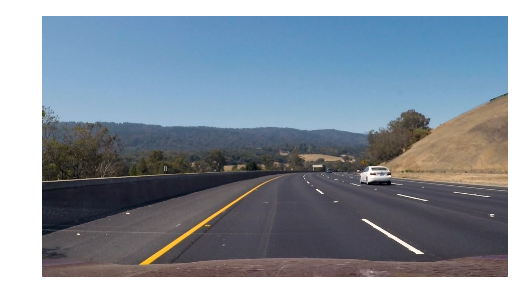

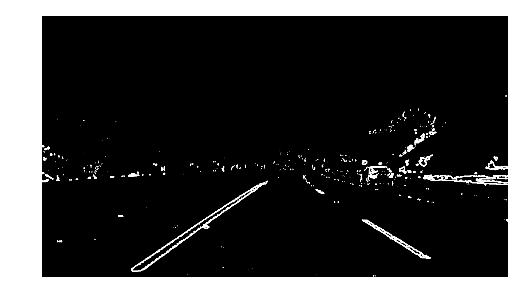

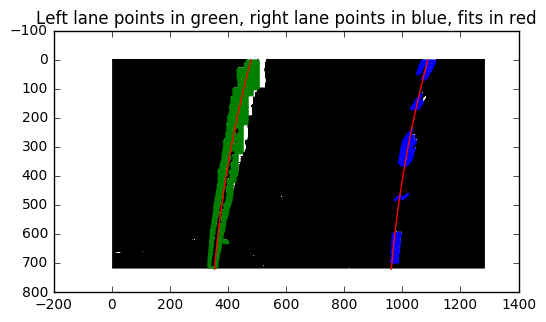

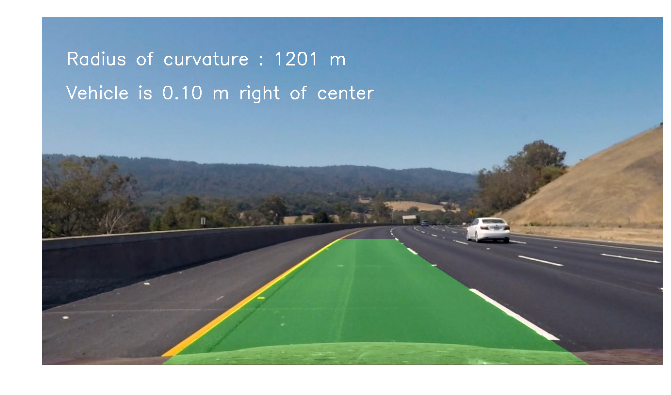

In [90]:
imageFile = imageFileList[4]
print("image file :", imageFile)

# import image as RGB
img = mpimg.imread(imageFile)

plt.imshow(img)
plt.axis('off')
plt.show()

# undistort image
img = cv2.undistort(img, mtx, dist, None, mtx)
    
# apply thresholding on unwarped image
mask = combined_mask(img)
    
# warp image perspective
warped = cv2.warpPerspective(mask, M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

# apply gradient-direction thresholding on warped binary mask
#warped = gradDir_mask(warped)

plt.imshow(mask, cmap='gray')
plt.axis('off')
plt.show()

# identify mask points belonging to left and right lane lines,
# starting from lost state
pointsLeft, pointsRight = find_points_in_lanes_from_lostState(warped)

# create Lane object
lane = Lane( mask.shape )

# perform sanity checks
# if sanity checks are passed, new estimation is deemed valid and lane parameters are updated
lane = calc_curvAndOffset_and_sanityChecks(pointsLeft, pointsRight, lane, 
            mask.shape, weightNewEstim=0.2, numCyclesLostForRestart=1)

# plot points belonging to each lane line and polynominal fits to points
plt.imshow(warped, cmap='gray')
plt.scatter([p[0] for p in pointsLeft], [p[1] for p in pointsLeft], s=1, facecolor='green', lw=0)
plt.scatter([p[0] for p in pointsRight], [p[1] for p in pointsRight], s=1, facecolor='blue', lw=0)
plt.plot(lane.xListL, lane.yList, 'r')
plt.plot(lane.xListR, lane.yList, 'r')
plt.title("Left lane points in green, right lane points in blue, fits in red")
plt.show()

# color detected lane on undistorted RGB image
imgLanes = plot_lanes(img, lane.yList, lane.xListL, lane.xListR, Minv)

# add curvature/xoffset info to image
font = cv2.FONT_HERSHEY_SIMPLEX

cv2.putText(imgLanes, 'Radius of curvature : {:.0f} m'.format(0.5*(lane.radCurvL+lane.radCurvR)),
    (50,100), font, 1.2, (255,255,255), 2)
    
if lane.xoffset>0:
    cv2.putText(imgLanes, 'Vehicle is {:.2f} m right of center'.format(lane.xoffset),
        (50,170), font, 1.2, (255,255,255), 2)
else:
    cv2.putText(imgLanes, 'Vehicle is {:.2f} m left of center'.format(-lane.xoffset),
        (50,170), font, 1.2, (255,255,255), 2)

plt.figure(figsize=(8,8))
plt.imshow(imgLanes)
plt.axis('off')
#plt.show()
plt.savefig('output_images/test3_output.jpg', bbox_inches='tight')



# 4. Run pipeline on videos

### Download and import everything needed to edit/save/watch video clips

In [23]:
import imageio
imageio.plugins.ffmpeg.download()

from moviepy.editor import VideoFileClip
from IPython.display import HTML

### Process project video

In [40]:
process_image.lane = Lane( [720, 1280] )

output_video_filename = 'project_video_processed.mp4'
input_video = VideoFileClip("project_video.mp4")

output_video = input_video.fl_image(process_image_for_video)
%time output_video.write_videofile(output_video_filename, audio=False)

seach from lost state
[MoviePy] >>>> Building video project_video_processed.mp4
[MoviePy] Writing video project_video_processed.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

seach from prev state


  0%|          | 1/1261 [00:00<17:53,  1.17it/s]

seach from prev state


  0%|          | 2/1261 [00:01<17:14,  1.22it/s]

seach from prev state


  0%|          | 3/1261 [00:02<17:11,  1.22it/s]

seach from prev state


  0%|          | 4/1261 [00:03<16:41,  1.25it/s]

seach from prev state


  0%|          | 5/1261 [00:03<16:45,  1.25it/s]

seach from prev state


  0%|          | 6/1261 [00:04<16:39,  1.26it/s]

seach from prev state


  1%|          | 7/1261 [00:05<18:18,  1.14it/s]

seach from prev state


  1%|          | 8/1261 [00:06<17:37,  1.18it/s]

seach from prev state


  1%|          | 9/1261 [00:07<17:59,  1.16it/s]

seach from prev state


  1%|          | 10/1261 [00:08<17:50,  1.17it/s]

seach from prev state


  1%|          | 11/1261 [00:09<17:15,  1.21it/s]

seach from prev state


  1%|          | 12/1261 [00:10<18:12,  1.14it/s]

seach from prev state


  1%|          | 13/1261 [00:10<17:25,  1.19it/s]

seach from prev state


  1%|          | 14/1261 [00:11<17:14,  1.21it/s]

seach from prev state


  1%|          | 15/1261 [00:12<17:22,  1.20it/s]

seach from prev state


  1%|▏         | 16/1261 [00:13<17:15,  1.20it/s]

seach from prev state


  1%|▏         | 17/1261 [00:14<17:10,  1.21it/s]

seach from prev state


  1%|▏         | 18/1261 [00:15<17:54,  1.16it/s]

seach from prev state


  2%|▏         | 19/1261 [00:16<18:52,  1.10it/s]

seach from prev state


  2%|▏         | 20/1261 [00:16<18:00,  1.15it/s]

seach from prev state


  2%|▏         | 21/1261 [00:17<18:53,  1.09it/s]

seach from prev state


  2%|▏         | 22/1261 [00:18<18:22,  1.12it/s]

seach from prev state


  2%|▏         | 23/1261 [00:19<17:48,  1.16it/s]

seach from prev state


  2%|▏         | 24/1261 [00:20<17:51,  1.15it/s]

seach from prev state


  2%|▏         | 25/1261 [00:21<17:35,  1.17it/s]

seach from prev state


  2%|▏         | 26/1261 [00:22<17:33,  1.17it/s]

seach from prev state


  2%|▏         | 27/1261 [00:22<16:52,  1.22it/s]

seach from prev state


  2%|▏         | 28/1261 [00:23<17:18,  1.19it/s]

seach from prev state


  2%|▏         | 29/1261 [00:24<17:22,  1.18it/s]

seach from prev state


  2%|▏         | 30/1261 [00:25<17:13,  1.19it/s]

seach from prev state


  2%|▏         | 31/1261 [00:26<17:09,  1.19it/s]

seach from prev state


  3%|▎         | 32/1261 [00:27<17:16,  1.19it/s]

seach from prev state


  3%|▎         | 33/1261 [00:28<17:42,  1.16it/s]

seach from prev state


  3%|▎         | 34/1261 [00:28<17:36,  1.16it/s]

seach from prev state


  3%|▎         | 35/1261 [00:29<18:11,  1.12it/s]

seach from prev state


  3%|▎         | 36/1261 [00:30<18:22,  1.11it/s]

seach from prev state


  3%|▎         | 37/1261 [00:31<19:05,  1.07it/s]

seach from prev state


  3%|▎         | 38/1261 [00:32<18:38,  1.09it/s]

seach from prev state


  3%|▎         | 39/1261 [00:33<19:31,  1.04it/s]

seach from prev state


  3%|▎         | 40/1261 [00:34<19:40,  1.03it/s]

seach from prev state


  3%|▎         | 41/1261 [00:35<19:28,  1.04it/s]

seach from prev state


  3%|▎         | 42/1261 [00:36<19:44,  1.03it/s]

seach from prev state


  3%|▎         | 43/1261 [00:37<19:53,  1.02it/s]

seach from prev state


  3%|▎         | 44/1261 [00:38<19:25,  1.04it/s]

seach from prev state


  4%|▎         | 45/1261 [00:39<19:09,  1.06it/s]

seach from prev state


  4%|▎         | 46/1261 [00:40<19:07,  1.06it/s]

seach from prev state


  4%|▎         | 47/1261 [00:41<18:20,  1.10it/s]

seach from prev state


  4%|▍         | 48/1261 [00:42<18:44,  1.08it/s]

seach from prev state


  4%|▍         | 49/1261 [00:42<17:36,  1.15it/s]

seach from prev state


  4%|▍         | 50/1261 [00:43<17:12,  1.17it/s]

seach from prev state


  4%|▍         | 51/1261 [00:44<16:56,  1.19it/s]

seach from prev state


  4%|▍         | 52/1261 [00:45<17:05,  1.18it/s]

seach from prev state


  4%|▍         | 53/1261 [00:46<16:46,  1.20it/s]

seach from prev state


  4%|▍         | 54/1261 [00:47<17:30,  1.15it/s]

seach from prev state


  4%|▍         | 55/1261 [00:47<17:03,  1.18it/s]

seach from prev state


  4%|▍         | 56/1261 [00:48<17:07,  1.17it/s]

seach from prev state


  5%|▍         | 57/1261 [00:49<17:18,  1.16it/s]

seach from prev state


  5%|▍         | 58/1261 [00:50<17:21,  1.16it/s]

seach from prev state


  5%|▍         | 59/1261 [00:51<17:15,  1.16it/s]

seach from prev state


  5%|▍         | 60/1261 [00:52<16:50,  1.19it/s]

seach from prev state


  5%|▍         | 61/1261 [00:52<16:23,  1.22it/s]

seach from prev state


  5%|▍         | 62/1261 [00:53<16:21,  1.22it/s]

seach from prev state


  5%|▍         | 63/1261 [00:54<16:09,  1.24it/s]

seach from prev state


  5%|▌         | 64/1261 [00:55<16:18,  1.22it/s]

seach from prev state


  5%|▌         | 65/1261 [00:56<17:21,  1.15it/s]

seach from prev state


  5%|▌         | 66/1261 [00:57<17:04,  1.17it/s]

seach from prev state


  5%|▌         | 67/1261 [00:58<16:57,  1.17it/s]

seach from prev state


  5%|▌         | 68/1261 [00:58<16:32,  1.20it/s]

seach from prev state


  5%|▌         | 69/1261 [00:59<16:40,  1.19it/s]

seach from prev state


  6%|▌         | 70/1261 [01:00<16:30,  1.20it/s]

seach from prev state


  6%|▌         | 71/1261 [01:01<16:35,  1.20it/s]

seach from prev state


  6%|▌         | 72/1261 [01:02<16:04,  1.23it/s]

seach from prev state


  6%|▌         | 73/1261 [01:02<16:05,  1.23it/s]

seach from prev state


  6%|▌         | 74/1261 [01:03<15:45,  1.26it/s]

seach from prev state


  6%|▌         | 75/1261 [01:04<16:03,  1.23it/s]

seach from prev state


  6%|▌         | 76/1261 [01:05<17:12,  1.15it/s]

seach from prev state


  6%|▌         | 77/1261 [01:06<16:32,  1.19it/s]

seach from prev state


  6%|▌         | 78/1261 [01:07<16:41,  1.18it/s]

seach from prev state


  6%|▋         | 79/1261 [01:07<16:06,  1.22it/s]

seach from prev state


  6%|▋         | 80/1261 [01:08<16:06,  1.22it/s]

seach from prev state


  6%|▋         | 81/1261 [01:09<16:28,  1.19it/s]

seach from prev state


  7%|▋         | 82/1261 [01:10<16:25,  1.20it/s]

seach from prev state


  7%|▋         | 83/1261 [01:11<17:31,  1.12it/s]

seach from prev state


  7%|▋         | 84/1261 [01:12<17:22,  1.13it/s]

seach from prev state


  7%|▋         | 85/1261 [01:13<17:25,  1.13it/s]

seach from prev state


  7%|▋         | 86/1261 [01:14<18:32,  1.06it/s]

seach from prev state


  7%|▋         | 87/1261 [01:15<18:22,  1.06it/s]

seach from prev state


  7%|▋         | 88/1261 [01:16<18:18,  1.07it/s]

seach from prev state


  7%|▋         | 89/1261 [01:17<19:03,  1.02it/s]

seach from prev state


  7%|▋         | 90/1261 [01:18<18:38,  1.05it/s]

seach from prev state


  7%|▋         | 91/1261 [01:19<17:55,  1.09it/s]

seach from prev state


  7%|▋         | 92/1261 [01:20<18:42,  1.04it/s]

seach from prev state


  7%|▋         | 93/1261 [01:21<19:26,  1.00it/s]

seach from prev state


  7%|▋         | 94/1261 [01:22<18:47,  1.04it/s]

seach from prev state


  8%|▊         | 95/1261 [01:22<18:02,  1.08it/s]

seach from prev state


  8%|▊         | 96/1261 [01:23<18:26,  1.05it/s]

seach from prev state


  8%|▊         | 97/1261 [01:24<18:16,  1.06it/s]

seach from prev state


  8%|▊         | 98/1261 [01:25<17:31,  1.11it/s]

seach from prev state


  8%|▊         | 99/1261 [01:26<17:06,  1.13it/s]

seach from prev state


  8%|▊         | 100/1261 [01:27<16:30,  1.17it/s]

seach from prev state


  8%|▊         | 101/1261 [01:28<16:19,  1.18it/s]

seach from prev state


  8%|▊         | 102/1261 [01:28<16:35,  1.16it/s]

seach from prev state


  8%|▊         | 103/1261 [01:29<17:00,  1.14it/s]

seach from prev state


  8%|▊         | 104/1261 [01:30<16:19,  1.18it/s]

seach from prev state


  8%|▊         | 105/1261 [01:31<16:48,  1.15it/s]

seach from prev state


  8%|▊         | 106/1261 [01:32<16:21,  1.18it/s]

seach from prev state


  8%|▊         | 107/1261 [01:33<15:37,  1.23it/s]

seach from prev state


  9%|▊         | 108/1261 [01:33<15:23,  1.25it/s]

seach from prev state


  9%|▊         | 109/1261 [01:34<14:53,  1.29it/s]

seach from prev state


  9%|▊         | 110/1261 [01:35<14:55,  1.29it/s]

seach from prev state


  9%|▉         | 111/1261 [01:36<14:33,  1.32it/s]

seach from prev state


  9%|▉         | 112/1261 [01:36<15:00,  1.28it/s]

seach from prev state


  9%|▉         | 113/1261 [01:37<14:43,  1.30it/s]

seach from prev state


  9%|▉         | 114/1261 [01:38<14:51,  1.29it/s]

seach from prev state


  9%|▉         | 115/1261 [01:39<14:57,  1.28it/s]

seach from prev state


  9%|▉         | 116/1261 [01:40<14:41,  1.30it/s]

seach from prev state


  9%|▉         | 117/1261 [01:40<14:51,  1.28it/s]

seach from prev state


  9%|▉         | 118/1261 [01:41<14:50,  1.28it/s]

seach from prev state


  9%|▉         | 119/1261 [01:42<14:59,  1.27it/s]

seach from prev state


 10%|▉         | 120/1261 [01:43<15:08,  1.26it/s]

seach from prev state


 10%|▉         | 121/1261 [01:43<14:48,  1.28it/s]

seach from prev state


 10%|▉         | 122/1261 [01:44<15:08,  1.25it/s]

seach from prev state


 10%|▉         | 123/1261 [01:45<14:47,  1.28it/s]

seach from prev state


 10%|▉         | 124/1261 [01:46<14:29,  1.31it/s]

seach from prev state


 10%|▉         | 125/1261 [01:47<14:38,  1.29it/s]

seach from prev state


 10%|▉         | 126/1261 [01:47<14:22,  1.32it/s]

seach from prev state


 10%|█         | 127/1261 [01:48<14:36,  1.29it/s]

seach from prev state


 10%|█         | 128/1261 [01:49<14:20,  1.32it/s]

seach from prev state


 10%|█         | 129/1261 [01:50<14:12,  1.33it/s]

seach from prev state


 10%|█         | 130/1261 [01:50<14:23,  1.31it/s]

seach from prev state


 10%|█         | 131/1261 [01:51<14:15,  1.32it/s]

seach from prev state


 10%|█         | 132/1261 [01:52<14:28,  1.30it/s]

seach from prev state


 11%|█         | 133/1261 [01:53<14:19,  1.31it/s]

seach from prev state


 11%|█         | 134/1261 [01:53<14:08,  1.33it/s]

seach from prev state


 11%|█         | 135/1261 [01:54<14:17,  1.31it/s]

seach from prev state


 11%|█         | 136/1261 [01:55<14:05,  1.33it/s]

seach from prev state


 11%|█         | 137/1261 [01:56<14:22,  1.30it/s]

seach from prev state


 11%|█         | 138/1261 [01:56<14:20,  1.31it/s]

seach from prev state


 11%|█         | 139/1261 [01:57<14:21,  1.30it/s]

seach from prev state


 11%|█         | 140/1261 [01:58<14:00,  1.33it/s]

seach from prev state


 11%|█         | 141/1261 [01:59<13:51,  1.35it/s]

seach from prev state


 11%|█▏        | 142/1261 [01:59<14:05,  1.32it/s]

seach from prev state


 11%|█▏        | 143/1261 [02:00<13:56,  1.34it/s]

seach from prev state


 11%|█▏        | 144/1261 [02:01<14:27,  1.29it/s]

seach from prev state


 11%|█▏        | 145/1261 [02:02<14:11,  1.31it/s]

seach from prev state


 12%|█▏        | 146/1261 [02:03<14:19,  1.30it/s]

seach from prev state


 12%|█▏        | 147/1261 [02:03<14:04,  1.32it/s]

seach from prev state


 12%|█▏        | 148/1261 [02:04<13:57,  1.33it/s]

seach from prev state


 12%|█▏        | 149/1261 [02:05<14:05,  1.32it/s]

seach from prev state


 12%|█▏        | 150/1261 [02:06<14:17,  1.30it/s]

seach from prev state


 12%|█▏        | 151/1261 [02:06<14:22,  1.29it/s]

seach from prev state


 12%|█▏        | 152/1261 [02:07<14:08,  1.31it/s]

seach from prev state


 12%|█▏        | 153/1261 [02:08<13:51,  1.33it/s]

seach from prev state


 12%|█▏        | 154/1261 [02:09<14:02,  1.31it/s]

seach from prev state


 12%|█▏        | 155/1261 [02:09<13:46,  1.34it/s]

seach from prev state


 12%|█▏        | 156/1261 [02:10<14:16,  1.29it/s]

seach from prev state


 12%|█▏        | 157/1261 [02:11<13:59,  1.32it/s]

seach from prev state


 13%|█▎        | 158/1261 [02:12<14:18,  1.28it/s]

seach from prev state


 13%|█▎        | 159/1261 [02:12<14:00,  1.31it/s]

seach from prev state


 13%|█▎        | 160/1261 [02:13<13:42,  1.34it/s]

seach from prev state


 13%|█▎        | 161/1261 [02:14<13:50,  1.32it/s]

seach from prev state


 13%|█▎        | 162/1261 [02:15<13:45,  1.33it/s]

seach from prev state


 13%|█▎        | 163/1261 [02:15<13:53,  1.32it/s]

seach from prev state


 13%|█▎        | 164/1261 [02:16<13:43,  1.33it/s]

seach from prev state


 13%|█▎        | 165/1261 [02:17<13:45,  1.33it/s]

seach from prev state


 13%|█▎        | 166/1261 [02:18<13:33,  1.35it/s]

seach from prev state


 13%|█▎        | 167/1261 [02:18<13:26,  1.36it/s]

seach from prev state


 13%|█▎        | 168/1261 [02:19<13:49,  1.32it/s]

seach from prev state


 13%|█▎        | 169/1261 [02:20<13:38,  1.33it/s]

seach from prev state


 13%|█▎        | 170/1261 [02:21<14:08,  1.29it/s]

seach from prev state


 14%|█▎        | 171/1261 [02:21<13:55,  1.30it/s]

seach from prev state


 14%|█▎        | 172/1261 [02:22<13:56,  1.30it/s]

seach from prev state


 14%|█▎        | 173/1261 [02:23<13:43,  1.32it/s]

seach from prev state


 14%|█▍        | 174/1261 [02:24<13:32,  1.34it/s]

seach from prev state


 14%|█▍        | 175/1261 [02:25<13:43,  1.32it/s]

seach from prev state


 14%|█▍        | 176/1261 [02:25<13:53,  1.30it/s]

seach from prev state


 14%|█▍        | 177/1261 [02:26<13:54,  1.30it/s]

seach from prev state


 14%|█▍        | 178/1261 [02:27<13:37,  1.33it/s]

seach from prev state


 14%|█▍        | 179/1261 [02:28<13:47,  1.31it/s]

seach from prev state


 14%|█▍        | 180/1261 [02:28<13:32,  1.33it/s]

seach from prev state


 14%|█▍        | 181/1261 [02:29<13:28,  1.34it/s]

seach from prev state


 14%|█▍        | 182/1261 [02:30<13:53,  1.30it/s]

seach from prev state


 15%|█▍        | 183/1261 [02:31<13:44,  1.31it/s]

seach from prev state


 15%|█▍        | 184/1261 [02:31<13:55,  1.29it/s]

seach from prev state


 15%|█▍        | 185/1261 [02:32<13:40,  1.31it/s]

seach from prev state


 15%|█▍        | 186/1261 [02:33<13:45,  1.30it/s]

seach from prev state


 15%|█▍        | 187/1261 [02:34<13:30,  1.33it/s]

seach from prev state


 15%|█▍        | 188/1261 [02:34<13:30,  1.32it/s]

seach from prev state


 15%|█▍        | 189/1261 [02:35<13:34,  1.32it/s]

seach from prev state


 15%|█▌        | 190/1261 [02:36<13:21,  1.34it/s]

seach from prev state


 15%|█▌        | 191/1261 [02:37<13:30,  1.32it/s]

seach from prev state


 15%|█▌        | 192/1261 [02:37<13:17,  1.34it/s]

seach from prev state


 15%|█▌        | 193/1261 [02:38<13:13,  1.35it/s]

seach from prev state


 15%|█▌        | 194/1261 [02:39<13:29,  1.32it/s]

seach from prev state


 15%|█▌        | 195/1261 [02:40<13:14,  1.34it/s]

seach from prev state


 16%|█▌        | 196/1261 [02:40<13:24,  1.32it/s]

seach from prev state


 16%|█▌        | 197/1261 [02:41<13:17,  1.33it/s]

seach from prev state


 16%|█▌        | 198/1261 [02:42<13:07,  1.35it/s]

seach from prev state


 16%|█▌        | 199/1261 [02:43<13:18,  1.33it/s]

seach from prev state


 16%|█▌        | 200/1261 [02:43<13:06,  1.35it/s]

seach from prev state


 16%|█▌        | 201/1261 [02:44<13:16,  1.33it/s]

seach from prev state


 16%|█▌        | 202/1261 [02:45<13:11,  1.34it/s]

seach from prev state


 16%|█▌        | 203/1261 [02:46<13:20,  1.32it/s]

seach from prev state


 16%|█▌        | 204/1261 [02:46<13:10,  1.34it/s]

seach from prev state


 16%|█▋        | 205/1261 [02:47<13:23,  1.31it/s]

seach from prev state


 16%|█▋        | 206/1261 [02:48<13:10,  1.33it/s]

seach from prev state


 16%|█▋        | 207/1261 [02:49<13:03,  1.34it/s]

seach from prev state


 16%|█▋        | 208/1261 [02:49<13:21,  1.31it/s]

seach from prev state


 17%|█▋        | 209/1261 [02:50<13:25,  1.31it/s]

seach from prev state


 17%|█▋        | 210/1261 [02:51<13:41,  1.28it/s]

seach from prev state


 17%|█▋        | 211/1261 [02:52<13:24,  1.31it/s]

seach from prev state


 17%|█▋        | 212/1261 [02:53<13:44,  1.27it/s]

seach from prev state


 17%|█▋        | 213/1261 [02:53<13:23,  1.30it/s]

seach from prev state


 17%|█▋        | 214/1261 [02:54<13:16,  1.31it/s]

seach from prev state


 17%|█▋        | 215/1261 [02:55<13:25,  1.30it/s]

seach from prev state


 17%|█▋        | 216/1261 [02:56<13:13,  1.32it/s]

seach from prev state


 17%|█▋        | 217/1261 [02:56<13:20,  1.30it/s]

seach from prev state


 17%|█▋        | 218/1261 [02:57<13:14,  1.31it/s]

seach from prev state


 17%|█▋        | 219/1261 [02:58<13:29,  1.29it/s]

seach from prev state


 17%|█▋        | 220/1261 [02:59<13:17,  1.30it/s]

seach from prev state


 18%|█▊        | 221/1261 [02:59<13:18,  1.30it/s]

seach from prev state


 18%|█▊        | 222/1261 [03:00<13:02,  1.33it/s]

seach from prev state


 18%|█▊        | 223/1261 [03:01<12:51,  1.34it/s]

seach from prev state


 18%|█▊        | 224/1261 [03:02<13:06,  1.32it/s]

seach from prev state


 18%|█▊        | 225/1261 [03:02<13:12,  1.31it/s]

seach from prev state


 18%|█▊        | 226/1261 [03:03<13:18,  1.30it/s]

seach from prev state


 18%|█▊        | 227/1261 [03:04<13:14,  1.30it/s]

seach from prev state


 18%|█▊        | 228/1261 [03:05<13:19,  1.29it/s]

seach from prev state


 18%|█▊        | 229/1261 [03:06<13:04,  1.32it/s]

seach from prev state


 18%|█▊        | 230/1261 [03:06<13:09,  1.31it/s]

seach from prev state


 18%|█▊        | 231/1261 [03:07<13:04,  1.31it/s]

seach from prev state


 18%|█▊        | 232/1261 [03:08<13:10,  1.30it/s]

seach from prev state


 18%|█▊        | 233/1261 [03:09<12:53,  1.33it/s]

seach from prev state


 19%|█▊        | 234/1261 [03:09<12:41,  1.35it/s]

seach from prev state


 19%|█▊        | 235/1261 [03:10<12:51,  1.33it/s]

seach from prev state


 19%|█▊        | 236/1261 [03:11<13:03,  1.31it/s]

seach from prev state


 19%|█▉        | 237/1261 [03:12<13:08,  1.30it/s]

seach from prev state


 19%|█▉        | 238/1261 [03:12<12:53,  1.32it/s]

seach from prev state


 19%|█▉        | 239/1261 [03:13<13:02,  1.31it/s]

seach from prev state


 19%|█▉        | 240/1261 [03:14<12:47,  1.33it/s]

seach from prev state


 19%|█▉        | 241/1261 [03:15<12:56,  1.31it/s]

seach from lost state


 19%|█▉        | 242/1261 [03:15<12:57,  1.31it/s]

seach from prev state


 19%|█▉        | 243/1261 [03:16<13:05,  1.30it/s]

seach from prev state


 19%|█▉        | 244/1261 [03:17<12:53,  1.31it/s]

seach from prev state


 19%|█▉        | 245/1261 [03:18<13:02,  1.30it/s]

seach from prev state


 20%|█▉        | 246/1261 [03:18<12:47,  1.32it/s]

seach from prev state


 20%|█▉        | 247/1261 [03:19<12:35,  1.34it/s]

seach from prev state


 20%|█▉        | 248/1261 [03:20<12:40,  1.33it/s]

seach from prev state


 20%|█▉        | 249/1261 [03:21<12:34,  1.34it/s]

seach from prev state


 20%|█▉        | 250/1261 [03:21<12:42,  1.33it/s]

seach from prev state


 20%|█▉        | 251/1261 [03:22<12:32,  1.34it/s]

seach from prev state


 20%|█▉        | 252/1261 [03:23<12:41,  1.33it/s]

seach from prev state


 20%|██        | 253/1261 [03:24<12:28,  1.35it/s]

seach from prev state


 20%|██        | 254/1261 [03:24<12:40,  1.32it/s]

seach from prev state


 20%|██        | 255/1261 [03:25<12:30,  1.34it/s]

seach from prev state


 20%|██        | 256/1261 [03:26<12:37,  1.33it/s]

seach from prev state


 20%|██        | 257/1261 [03:27<12:27,  1.34it/s]

seach from prev state


 20%|██        | 258/1261 [03:27<12:41,  1.32it/s]

seach from prev state


 21%|██        | 259/1261 [03:28<12:29,  1.34it/s]

seach from prev state


 21%|██        | 260/1261 [03:29<12:20,  1.35it/s]

seach from prev state


 21%|██        | 261/1261 [03:30<12:33,  1.33it/s]

seach from prev state


 21%|██        | 262/1261 [03:30<12:20,  1.35it/s]

seach from prev state


 21%|██        | 263/1261 [03:31<12:32,  1.33it/s]

seach from prev state


 21%|██        | 264/1261 [03:32<12:22,  1.34it/s]

seach from prev state


 21%|██        | 265/1261 [03:33<12:35,  1.32it/s]

seach from prev state


 21%|██        | 266/1261 [03:33<12:23,  1.34it/s]

seach from prev state


 21%|██        | 267/1261 [03:34<12:32,  1.32it/s]

seach from prev state


 21%|██▏       | 268/1261 [03:35<12:24,  1.33it/s]

seach from prev state


 21%|██▏       | 269/1261 [03:36<12:32,  1.32it/s]

seach from prev state


 21%|██▏       | 270/1261 [03:36<12:18,  1.34it/s]

seach from prev state


 21%|██▏       | 271/1261 [03:37<12:34,  1.31it/s]

seach from prev state


 22%|██▏       | 272/1261 [03:38<12:18,  1.34it/s]

seach from prev state


 22%|██▏       | 273/1261 [03:39<12:13,  1.35it/s]

seach from prev state


 22%|██▏       | 274/1261 [03:40<12:45,  1.29it/s]

seach from prev state


 22%|██▏       | 275/1261 [03:40<12:28,  1.32it/s]

seach from prev state


 22%|██▏       | 276/1261 [03:41<12:52,  1.27it/s]

seach from prev state


 22%|██▏       | 277/1261 [03:42<12:35,  1.30it/s]

seach from prev state


 22%|██▏       | 278/1261 [03:43<12:34,  1.30it/s]

seach from prev state


 22%|██▏       | 279/1261 [03:43<12:20,  1.33it/s]

seach from prev state


 22%|██▏       | 280/1261 [03:44<12:33,  1.30it/s]

seach from prev state


 22%|██▏       | 281/1261 [03:45<12:20,  1.32it/s]

seach from prev state


 22%|██▏       | 282/1261 [03:46<12:23,  1.32it/s]

seach from prev state


 22%|██▏       | 283/1261 [03:46<12:10,  1.34it/s]

seach from prev state


 23%|██▎       | 284/1261 [03:47<12:05,  1.35it/s]

seach from prev state


 23%|██▎       | 285/1261 [03:48<12:12,  1.33it/s]

seach from prev state


 23%|██▎       | 286/1261 [03:49<12:05,  1.34it/s]

seach from prev state


 23%|██▎       | 287/1261 [03:49<12:16,  1.32it/s]

seach from prev state


 23%|██▎       | 288/1261 [03:50<12:08,  1.34it/s]

seach from prev state


 23%|██▎       | 289/1261 [03:51<12:15,  1.32it/s]

seach from prev state


 23%|██▎       | 290/1261 [03:52<12:07,  1.33it/s]

seach from prev state


 23%|██▎       | 291/1261 [03:52<12:15,  1.32it/s]

seach from prev state


 23%|██▎       | 292/1261 [03:53<12:04,  1.34it/s]

seach from prev state


 23%|██▎       | 293/1261 [03:54<12:07,  1.33it/s]

seach from lost state


 23%|██▎       | 294/1261 [03:55<12:16,  1.31it/s]

seach from prev state


 23%|██▎       | 295/1261 [03:55<12:35,  1.28it/s]

seach from prev state


 23%|██▎       | 296/1261 [03:56<12:13,  1.32it/s]

seach from prev state


 24%|██▎       | 297/1261 [03:57<12:08,  1.32it/s]

seach from prev state


 24%|██▎       | 298/1261 [03:58<12:16,  1.31it/s]

seach from prev state


 24%|██▎       | 299/1261 [03:58<12:01,  1.33it/s]

seach from prev state


 24%|██▍       | 300/1261 [03:59<12:09,  1.32it/s]

seach from prev state


 24%|██▍       | 301/1261 [04:00<12:00,  1.33it/s]

seach from prev state


 24%|██▍       | 302/1261 [04:01<12:28,  1.28it/s]

seach from prev state


 24%|██▍       | 303/1261 [04:02<12:27,  1.28it/s]

seach from prev state


 24%|██▍       | 304/1261 [04:02<12:48,  1.25it/s]

seach from prev state


 24%|██▍       | 305/1261 [04:03<12:36,  1.26it/s]

seach from prev state


 24%|██▍       | 306/1261 [04:04<12:55,  1.23it/s]

seach from prev state


 24%|██▍       | 307/1261 [04:05<12:50,  1.24it/s]

seach from prev state


 24%|██▍       | 308/1261 [04:06<13:00,  1.22it/s]

seach from prev state


 25%|██▍       | 309/1261 [04:06<12:52,  1.23it/s]

seach from prev state


 25%|██▍       | 310/1261 [04:07<12:58,  1.22it/s]

seach from prev state


 25%|██▍       | 311/1261 [04:08<12:42,  1.25it/s]

seach from prev state


 25%|██▍       | 312/1261 [04:09<12:52,  1.23it/s]

seach from prev state


 25%|██▍       | 313/1261 [04:10<12:38,  1.25it/s]

seach from prev state


 25%|██▍       | 314/1261 [04:10<12:28,  1.27it/s]

seach from prev state


 25%|██▍       | 315/1261 [04:11<12:37,  1.25it/s]

seach from prev state


 25%|██▌       | 316/1261 [04:12<12:29,  1.26it/s]

seach from prev state


 25%|██▌       | 317/1261 [04:13<12:38,  1.24it/s]

seach from prev state


 25%|██▌       | 318/1261 [04:14<12:29,  1.26it/s]

seach from prev state


 25%|██▌       | 319/1261 [04:14<12:21,  1.27it/s]

seach from prev state


 25%|██▌       | 320/1261 [04:15<12:27,  1.26it/s]

seach from prev state


 25%|██▌       | 321/1261 [04:16<12:21,  1.27it/s]

seach from prev state


 26%|██▌       | 322/1261 [04:17<12:26,  1.26it/s]

seach from prev state


 26%|██▌       | 323/1261 [04:18<12:19,  1.27it/s]

seach from prev state


 26%|██▌       | 324/1261 [04:18<12:18,  1.27it/s]

seach from prev state


 26%|██▌       | 325/1261 [04:19<12:16,  1.27it/s]

seach from prev state


 26%|██▌       | 326/1261 [04:20<11:57,  1.30it/s]

seach from prev state


 26%|██▌       | 327/1261 [04:21<12:03,  1.29it/s]

seach from prev state


 26%|██▌       | 328/1261 [04:21<11:48,  1.32it/s]

seach from prev state


 26%|██▌       | 329/1261 [04:22<11:57,  1.30it/s]

seach from prev state


 26%|██▌       | 330/1261 [04:23<11:42,  1.33it/s]

seach from prev state


 26%|██▌       | 331/1261 [04:24<11:52,  1.31it/s]

seach from prev state


 26%|██▋       | 332/1261 [04:24<11:39,  1.33it/s]

seach from prev state


 26%|██▋       | 333/1261 [04:25<11:50,  1.31it/s]

seach from prev state


 26%|██▋       | 334/1261 [04:26<11:37,  1.33it/s]

seach from prev state


 27%|██▋       | 335/1261 [04:27<11:50,  1.30it/s]

seach from prev state


 27%|██▋       | 336/1261 [04:27<11:36,  1.33it/s]

seach from lost state


 27%|██▋       | 337/1261 [04:28<12:08,  1.27it/s]

seach from prev state


 27%|██▋       | 338/1261 [04:29<11:51,  1.30it/s]

seach from prev state


 27%|██▋       | 339/1261 [04:30<11:55,  1.29it/s]

seach from prev state


 27%|██▋       | 340/1261 [04:31<11:42,  1.31it/s]

seach from prev state


 27%|██▋       | 341/1261 [04:31<11:51,  1.29it/s]

seach from prev state


 27%|██▋       | 342/1261 [04:32<11:36,  1.32it/s]

seach from prev state


 27%|██▋       | 343/1261 [04:33<11:45,  1.30it/s]

seach from prev state


 27%|██▋       | 344/1261 [04:34<11:34,  1.32it/s]

seach from prev state


 27%|██▋       | 345/1261 [04:34<11:43,  1.30it/s]

seach from prev state


 27%|██▋       | 346/1261 [04:35<11:35,  1.32it/s]

seach from prev state


 28%|██▊       | 347/1261 [04:36<11:50,  1.29it/s]

seach from prev state


 28%|██▊       | 348/1261 [04:37<11:37,  1.31it/s]

seach from prev state


 28%|██▊       | 349/1261 [04:38<11:49,  1.29it/s]

seach from prev state


 28%|██▊       | 350/1261 [04:38<12:02,  1.26it/s]

seach from prev state


 28%|██▊       | 351/1261 [04:39<12:39,  1.20it/s]

seach from prev state


 28%|██▊       | 352/1261 [04:40<12:43,  1.19it/s]

seach from prev state


 28%|██▊       | 353/1261 [04:41<13:06,  1.15it/s]

seach from prev state


 28%|██▊       | 354/1261 [04:42<12:56,  1.17it/s]

seach from prev state


 28%|██▊       | 355/1261 [04:43<13:16,  1.14it/s]

seach from prev state


 28%|██▊       | 356/1261 [04:44<13:15,  1.14it/s]

seach from prev state


 28%|██▊       | 357/1261 [04:44<12:54,  1.17it/s]

seach from prev state


 28%|██▊       | 358/1261 [04:45<12:16,  1.23it/s]

seach from prev state


 28%|██▊       | 359/1261 [04:46<12:08,  1.24it/s]

seach from prev state


 29%|██▊       | 360/1261 [04:47<11:46,  1.27it/s]

seach from prev state


 29%|██▊       | 361/1261 [04:48<11:48,  1.27it/s]

seach from prev state


 29%|██▊       | 362/1261 [04:48<11:31,  1.30it/s]

seach from prev state


 29%|██▉       | 363/1261 [04:49<11:36,  1.29it/s]

seach from prev state


 29%|██▉       | 364/1261 [04:50<11:22,  1.31it/s]

seach from prev state


 29%|██▉       | 365/1261 [04:51<11:32,  1.29it/s]

seach from prev state


 29%|██▉       | 366/1261 [04:51<11:17,  1.32it/s]

seach from prev state


 29%|██▉       | 367/1261 [04:52<11:12,  1.33it/s]

seach from prev state


 29%|██▉       | 368/1261 [04:53<11:19,  1.31it/s]

seach from prev state


 29%|██▉       | 369/1261 [04:54<11:12,  1.33it/s]

seach from prev state


 29%|██▉       | 370/1261 [04:54<11:21,  1.31it/s]

seach from prev state


 29%|██▉       | 371/1261 [04:55<11:12,  1.32it/s]

seach from prev state


 30%|██▉       | 372/1261 [04:56<11:19,  1.31it/s]

seach from prev state


 30%|██▉       | 373/1261 [04:57<11:24,  1.30it/s]

seach from prev state


 30%|██▉       | 374/1261 [04:57<11:11,  1.32it/s]

seach from prev state


 30%|██▉       | 375/1261 [04:58<11:21,  1.30it/s]

seach from prev state


 30%|██▉       | 376/1261 [04:59<11:08,  1.32it/s]

seach from prev state


 30%|██▉       | 377/1261 [05:00<11:04,  1.33it/s]

seach from prev state


 30%|██▉       | 378/1261 [05:00<11:12,  1.31it/s]

seach from prev state


 30%|███       | 379/1261 [05:01<11:04,  1.33it/s]

seach from prev state


 30%|███       | 380/1261 [05:02<11:08,  1.32it/s]

seach from prev state


 30%|███       | 381/1261 [05:03<11:01,  1.33it/s]

seach from prev state


 30%|███       | 382/1261 [05:03<11:09,  1.31it/s]

seach from prev state


 30%|███       | 383/1261 [05:04<11:01,  1.33it/s]

seach from prev state


 30%|███       | 384/1261 [05:05<11:08,  1.31it/s]

seach from prev state


 31%|███       | 385/1261 [05:06<11:02,  1.32it/s]

seach from prev state


 31%|███       | 386/1261 [05:06<11:10,  1.31it/s]

seach from prev state


 31%|███       | 387/1261 [05:07<11:00,  1.32it/s]

seach from prev state


 31%|███       | 388/1261 [05:08<11:05,  1.31it/s]

seach from prev state


 31%|███       | 389/1261 [05:09<11:10,  1.30it/s]

seach from prev state


 31%|███       | 390/1261 [05:10<11:03,  1.31it/s]

seach from prev state


 31%|███       | 391/1261 [05:10<11:12,  1.29it/s]

seach from prev state


 31%|███       | 392/1261 [05:11<10:58,  1.32it/s]

seach from prev state


 31%|███       | 393/1261 [05:12<11:08,  1.30it/s]

seach from prev state


 31%|███       | 394/1261 [05:13<10:57,  1.32it/s]

seach from prev state


 31%|███▏      | 395/1261 [05:13<11:09,  1.29it/s]

seach from prev state


 31%|███▏      | 396/1261 [05:14<10:56,  1.32it/s]

seach from prev state


 31%|███▏      | 397/1261 [05:15<11:06,  1.30it/s]

seach from prev state


 32%|███▏      | 398/1261 [05:16<10:53,  1.32it/s]

seach from prev state


 32%|███▏      | 399/1261 [05:16<11:01,  1.30it/s]

seach from prev state


 32%|███▏      | 400/1261 [05:17<10:50,  1.32it/s]

seach from prev state


 32%|███▏      | 401/1261 [05:18<10:59,  1.30it/s]

seach from prev state


 32%|███▏      | 402/1261 [05:19<10:48,  1.32it/s]

seach from prev state


 32%|███▏      | 403/1261 [05:19<10:59,  1.30it/s]

seach from prev state


 32%|███▏      | 404/1261 [05:20<10:47,  1.32it/s]

seach from prev state


 32%|███▏      | 405/1261 [05:21<11:06,  1.29it/s]

seach from prev state


 32%|███▏      | 406/1261 [05:22<11:26,  1.25it/s]

seach from prev state


 32%|███▏      | 407/1261 [05:23<12:11,  1.17it/s]

seach from prev state


 32%|███▏      | 408/1261 [05:24<12:33,  1.13it/s]

seach from prev state


 32%|███▏      | 409/1261 [05:26<17:36,  1.24s/it]

seach from prev state


 33%|███▎      | 410/1261 [05:27<16:17,  1.15s/it]

seach from prev state


 33%|███▎      | 411/1261 [05:28<15:30,  1.10s/it]

seach from prev state


 33%|███▎      | 412/1261 [05:29<14:45,  1.04s/it]

seach from prev state


 33%|███▎      | 413/1261 [05:30<14:39,  1.04s/it]

seach from prev state


 33%|███▎      | 414/1261 [05:31<14:20,  1.02s/it]

seach from prev state


 33%|███▎      | 415/1261 [05:32<13:59,  1.01it/s]

seach from prev state


 33%|███▎      | 416/1261 [05:32<13:04,  1.08it/s]

seach from prev state


 33%|███▎      | 417/1261 [05:33<12:47,  1.10it/s]

seach from prev state


 33%|███▎      | 418/1261 [05:34<11:59,  1.17it/s]

seach from prev state


 33%|███▎      | 419/1261 [05:35<11:46,  1.19it/s]

seach from prev state


 33%|███▎      | 420/1261 [05:36<11:16,  1.24it/s]

seach from prev state


 33%|███▎      | 421/1261 [05:36<11:19,  1.24it/s]

seach from prev state


 33%|███▎      | 422/1261 [05:37<11:01,  1.27it/s]

seach from prev state


 34%|███▎      | 423/1261 [05:38<11:00,  1.27it/s]

seach from prev state


 34%|███▎      | 424/1261 [05:39<10:44,  1.30it/s]

seach from prev state


 34%|███▎      | 425/1261 [05:39<10:46,  1.29it/s]

seach from prev state


 34%|███▍      | 426/1261 [05:40<10:41,  1.30it/s]

seach from prev state


 34%|███▍      | 427/1261 [05:41<11:08,  1.25it/s]

seach from prev state


 34%|███▍      | 428/1261 [05:42<10:57,  1.27it/s]

seach from prev state


 34%|███▍      | 429/1261 [05:43<11:06,  1.25it/s]

seach from prev state


 34%|███▍      | 430/1261 [05:43<10:47,  1.28it/s]

seach from prev state


 34%|███▍      | 431/1261 [05:44<10:49,  1.28it/s]

seach from prev state


 34%|███▍      | 432/1261 [05:45<10:49,  1.28it/s]

seach from prev state


 34%|███▍      | 433/1261 [05:46<10:38,  1.30it/s]

seach from prev state


 34%|███▍      | 434/1261 [05:46<10:39,  1.29it/s]

seach from prev state


 34%|███▍      | 435/1261 [05:47<10:28,  1.31it/s]

seach from prev state


 35%|███▍      | 436/1261 [05:48<10:33,  1.30it/s]

seach from prev state


 35%|███▍      | 437/1261 [05:49<10:23,  1.32it/s]

seach from prev state


 35%|███▍      | 438/1261 [05:49<10:29,  1.31it/s]

seach from prev state


 35%|███▍      | 439/1261 [05:50<10:21,  1.32it/s]

seach from prev state


 35%|███▍      | 440/1261 [05:51<10:29,  1.31it/s]

seach from prev state


 35%|███▍      | 441/1261 [05:52<10:18,  1.33it/s]

seach from prev state


 35%|███▌      | 442/1261 [05:52<10:11,  1.34it/s]

seach from prev state


 35%|███▌      | 443/1261 [05:53<10:20,  1.32it/s]

seach from prev state


 35%|███▌      | 444/1261 [05:54<10:30,  1.30it/s]

seach from prev state


 35%|███▌      | 445/1261 [05:55<10:22,  1.31it/s]

seach from prev state


 35%|███▌      | 446/1261 [05:56<10:26,  1.30it/s]

seach from prev state


 35%|███▌      | 447/1261 [05:56<10:14,  1.32it/s]

seach from prev state


 36%|███▌      | 448/1261 [05:57<10:21,  1.31it/s]

seach from prev state


 36%|███▌      | 449/1261 [05:58<10:10,  1.33it/s]

seach from prev state


 36%|███▌      | 450/1261 [05:59<10:17,  1.31it/s]

seach from prev state


 36%|███▌      | 451/1261 [05:59<10:18,  1.31it/s]

seach from prev state


 36%|███▌      | 452/1261 [06:00<10:33,  1.28it/s]

seach from prev state


 36%|███▌      | 453/1261 [06:01<10:33,  1.27it/s]

seach from prev state


 36%|███▌      | 454/1261 [06:02<10:46,  1.25it/s]

seach from prev state


 36%|███▌      | 455/1261 [06:03<10:30,  1.28it/s]

seach from prev state


 36%|███▌      | 456/1261 [06:03<10:33,  1.27it/s]

seach from prev state


 36%|███▌      | 457/1261 [06:04<10:22,  1.29it/s]

seach from prev state


 36%|███▋      | 458/1261 [06:05<10:29,  1.27it/s]

seach from prev state


 36%|███▋      | 459/1261 [06:06<10:18,  1.30it/s]

seach from prev state


 36%|███▋      | 460/1261 [06:06<10:22,  1.29it/s]

seach from prev state


 37%|███▋      | 461/1261 [06:07<10:15,  1.30it/s]

seach from prev state


 37%|███▋      | 462/1261 [06:08<10:24,  1.28it/s]

seach from prev state


 37%|███▋      | 463/1261 [06:09<10:15,  1.30it/s]

seach from prev state


 37%|███▋      | 464/1261 [06:10<10:22,  1.28it/s]

seach from prev state


 37%|███▋      | 465/1261 [06:10<10:10,  1.30it/s]

seach from prev state


 37%|███▋      | 466/1261 [06:11<10:18,  1.28it/s]

seach from prev state


 37%|███▋      | 467/1261 [06:12<10:09,  1.30it/s]

seach from prev state


 37%|███▋      | 468/1261 [06:13<10:38,  1.24it/s]

seach from prev state


 37%|███▋      | 469/1261 [06:13<10:23,  1.27it/s]

seach from prev state


 37%|███▋      | 470/1261 [06:14<10:24,  1.27it/s]

seach from prev state


 37%|███▋      | 471/1261 [06:15<10:13,  1.29it/s]

seach from prev state


 37%|███▋      | 472/1261 [06:16<10:16,  1.28it/s]

seach from prev state


 38%|███▊      | 473/1261 [06:17<10:06,  1.30it/s]

seach from prev state


 38%|███▊      | 474/1261 [06:17<10:19,  1.27it/s]

seach from prev state


 38%|███▊      | 475/1261 [06:18<10:13,  1.28it/s]

seach from prev state


 38%|███▊      | 476/1261 [06:19<10:20,  1.26it/s]

seach from prev state


 38%|███▊      | 477/1261 [06:20<10:10,  1.28it/s]

seach from prev state


 38%|███▊      | 478/1261 [06:21<10:14,  1.27it/s]

seach from prev state


 38%|███▊      | 479/1261 [06:21<10:04,  1.29it/s]

seach from prev state


 38%|███▊      | 480/1261 [06:22<10:10,  1.28it/s]

seach from prev state


 38%|███▊      | 481/1261 [06:23<10:05,  1.29it/s]

seach from prev state


 38%|███▊      | 482/1261 [06:24<10:09,  1.28it/s]

seach from prev state


 38%|███▊      | 483/1261 [06:24<09:59,  1.30it/s]

seach from prev state


 38%|███▊      | 484/1261 [06:25<09:59,  1.30it/s]

seach from prev state


 38%|███▊      | 485/1261 [06:26<09:50,  1.31it/s]

seach from prev state


 39%|███▊      | 486/1261 [06:27<10:03,  1.28it/s]

seach from prev state


 39%|███▊      | 487/1261 [06:27<09:51,  1.31it/s]

seach from prev state


 39%|███▊      | 488/1261 [06:28<09:58,  1.29it/s]

seach from prev state


 39%|███▉      | 489/1261 [06:29<09:51,  1.31it/s]

seach from prev state


 39%|███▉      | 490/1261 [06:30<09:53,  1.30it/s]

seach from prev state


 39%|███▉      | 491/1261 [06:31<09:49,  1.31it/s]

seach from prev state


 39%|███▉      | 492/1261 [06:31<09:54,  1.29it/s]

seach from prev state


 39%|███▉      | 493/1261 [06:32<09:43,  1.32it/s]

seach from prev state


 39%|███▉      | 494/1261 [06:33<10:01,  1.28it/s]

seach from prev state


 39%|███▉      | 495/1261 [06:34<09:59,  1.28it/s]

seach from prev state


 39%|███▉      | 496/1261 [06:34<10:10,  1.25it/s]

seach from prev state


 39%|███▉      | 497/1261 [06:35<10:01,  1.27it/s]

seach from prev state


 39%|███▉      | 498/1261 [06:36<10:03,  1.26it/s]

seach from prev state


 40%|███▉      | 499/1261 [06:37<10:06,  1.26it/s]

seach from prev state


 40%|███▉      | 500/1261 [06:38<09:52,  1.28it/s]

seach from prev state


 40%|███▉      | 501/1261 [06:38<10:01,  1.26it/s]

seach from prev state


 40%|███▉      | 502/1261 [06:39<09:49,  1.29it/s]

seach from prev state


 40%|███▉      | 503/1261 [06:40<09:53,  1.28it/s]

seach from prev state


 40%|███▉      | 504/1261 [06:41<09:43,  1.30it/s]

seach from prev state


 40%|████      | 505/1261 [06:41<09:48,  1.28it/s]

seach from prev state


 40%|████      | 506/1261 [06:42<09:38,  1.31it/s]

seach from prev state


 40%|████      | 507/1261 [06:43<09:48,  1.28it/s]

seach from prev state


 40%|████      | 508/1261 [06:44<09:38,  1.30it/s]

seach from prev state


 40%|████      | 509/1261 [06:45<09:46,  1.28it/s]

seach from prev state


 40%|████      | 510/1261 [06:45<09:36,  1.30it/s]

seach from prev state


 41%|████      | 511/1261 [06:46<09:43,  1.29it/s]

seach from prev state


 41%|████      | 512/1261 [06:47<09:31,  1.31it/s]

seach from prev state


 41%|████      | 513/1261 [06:48<09:42,  1.28it/s]

seach from prev state


 41%|████      | 514/1261 [06:48<09:31,  1.31it/s]

seach from prev state


 41%|████      | 515/1261 [06:49<09:35,  1.30it/s]

seach from prev state


 41%|████      | 516/1261 [06:50<09:23,  1.32it/s]

seach from prev state


 41%|████      | 517/1261 [06:51<09:30,  1.30it/s]

seach from prev state


 41%|████      | 518/1261 [06:51<09:18,  1.33it/s]

seach from prev state


 41%|████      | 519/1261 [06:52<09:26,  1.31it/s]

seach from prev state


 41%|████      | 520/1261 [06:53<09:25,  1.31it/s]

seach from prev state


 41%|████▏     | 521/1261 [06:54<10:16,  1.20it/s]

seach from prev state


 41%|████▏     | 522/1261 [06:55<10:07,  1.22it/s]

seach from prev state


 41%|████▏     | 523/1261 [06:56<10:48,  1.14it/s]

seach from prev state


 42%|████▏     | 524/1261 [06:57<10:40,  1.15it/s]

seach from prev state


 42%|████▏     | 525/1261 [06:57<10:39,  1.15it/s]

seach from prev state


 42%|████▏     | 526/1261 [06:58<10:56,  1.12it/s]

seach from prev state


 42%|████▏     | 527/1261 [06:59<10:45,  1.14it/s]

seach from prev state


 42%|████▏     | 528/1261 [07:00<10:37,  1.15it/s]

seach from prev state


 42%|████▏     | 529/1261 [07:01<10:20,  1.18it/s]

seach from prev state


 42%|████▏     | 530/1261 [07:02<10:25,  1.17it/s]

seach from prev state


 42%|████▏     | 531/1261 [07:03<10:06,  1.20it/s]

seach from prev state


 42%|████▏     | 532/1261 [07:03<10:06,  1.20it/s]

seach from prev state


 42%|████▏     | 533/1261 [07:04<10:22,  1.17it/s]

seach from prev state


 42%|████▏     | 534/1261 [07:05<10:48,  1.12it/s]

seach from prev state


 42%|████▏     | 535/1261 [07:06<10:48,  1.12it/s]

seach from prev state


 43%|████▎     | 536/1261 [07:07<11:03,  1.09it/s]

seach from prev state


 43%|████▎     | 537/1261 [07:08<10:59,  1.10it/s]

seach from prev state


 43%|████▎     | 538/1261 [07:09<10:54,  1.10it/s]

seach from prev state


 43%|████▎     | 539/1261 [07:10<11:06,  1.08it/s]

seach from prev state


 43%|████▎     | 540/1261 [07:11<11:13,  1.07it/s]

seach from prev state


 43%|████▎     | 541/1261 [07:12<12:00,  1.00s/it]

seach from prev state


 43%|████▎     | 542/1261 [07:13<11:51,  1.01it/s]

seach from prev state


 43%|████▎     | 543/1261 [07:14<11:11,  1.07it/s]

seach from prev state


 43%|████▎     | 544/1261 [07:15<12:24,  1.04s/it]

seach from prev state


 43%|████▎     | 545/1261 [07:16<11:40,  1.02it/s]

seach from prev state


 43%|████▎     | 546/1261 [07:17<11:47,  1.01it/s]

seach from prev state


 43%|████▎     | 547/1261 [07:18<11:21,  1.05it/s]

seach from prev state


 43%|████▎     | 548/1261 [07:19<11:31,  1.03it/s]

seach from prev state


 44%|████▎     | 549/1261 [07:20<11:08,  1.06it/s]

seach from prev state


 44%|████▎     | 550/1261 [07:21<10:59,  1.08it/s]

seach from prev state


 44%|████▎     | 551/1261 [07:21<10:38,  1.11it/s]

seach from prev state


 44%|████▍     | 552/1261 [07:22<10:27,  1.13it/s]

seach from prev state


 44%|████▍     | 553/1261 [07:23<10:24,  1.13it/s]

seach from prev state


 44%|████▍     | 554/1261 [07:24<11:04,  1.06it/s]

seach from prev state


 44%|████▍     | 555/1261 [07:25<11:09,  1.05it/s]

seach from prev state


 44%|████▍     | 556/1261 [07:26<11:04,  1.06it/s]

seach from prev state


 44%|████▍     | 557/1261 [07:27<10:58,  1.07it/s]

seach from prev state


 44%|████▍     | 558/1261 [07:28<10:35,  1.11it/s]

seach from prev state


 44%|████▍     | 559/1261 [07:29<10:29,  1.11it/s]

seach from prev state


 44%|████▍     | 560/1261 [07:30<10:11,  1.15it/s]

seach from prev state


 44%|████▍     | 561/1261 [07:30<10:01,  1.16it/s]

seach from prev state


 45%|████▍     | 562/1261 [07:31<09:48,  1.19it/s]

seach from prev state


 45%|████▍     | 563/1261 [07:32<09:55,  1.17it/s]

seach from prev state


 45%|████▍     | 564/1261 [07:33<09:48,  1.18it/s]

seach from prev state


 45%|████▍     | 565/1261 [07:34<09:55,  1.17it/s]

seach from prev state


 45%|████▍     | 566/1261 [07:35<09:50,  1.18it/s]

seach from prev state


 45%|████▍     | 567/1261 [07:35<09:46,  1.18it/s]

seach from prev state


 45%|████▌     | 568/1261 [07:36<09:50,  1.17it/s]

seach from prev state


 45%|████▌     | 569/1261 [07:37<09:38,  1.20it/s]

seach from prev state


 45%|████▌     | 570/1261 [07:38<09:34,  1.20it/s]

seach from prev state


 45%|████▌     | 571/1261 [07:39<09:48,  1.17it/s]

seach from prev state


 45%|████▌     | 572/1261 [07:40<09:42,  1.18it/s]

seach from prev state


 45%|████▌     | 573/1261 [07:41<09:45,  1.18it/s]

seach from prev state


 46%|████▌     | 574/1261 [07:41<09:35,  1.19it/s]

seach from prev state


 46%|████▌     | 575/1261 [07:42<09:30,  1.20it/s]

seach from prev state


 46%|████▌     | 576/1261 [07:43<09:37,  1.19it/s]

seach from prev state


 46%|████▌     | 577/1261 [07:44<09:49,  1.16it/s]

seach from lost state


 46%|████▌     | 578/1261 [07:45<10:22,  1.10it/s]

seach from prev state


 46%|████▌     | 579/1261 [07:46<09:49,  1.16it/s]

seach from prev state


 46%|████▌     | 580/1261 [07:47<09:56,  1.14it/s]

seach from prev state


 46%|████▌     | 581/1261 [07:48<10:40,  1.06it/s]

seach from prev state


 46%|████▌     | 582/1261 [07:49<10:27,  1.08it/s]

seach from prev state


 46%|████▌     | 583/1261 [07:49<10:06,  1.12it/s]

seach from prev state


 46%|████▋     | 584/1261 [07:50<09:35,  1.18it/s]

seach from prev state


 46%|████▋     | 585/1261 [07:51<09:25,  1.20it/s]

seach from prev state


 46%|████▋     | 586/1261 [07:52<09:04,  1.24it/s]

seach from prev state


 47%|████▋     | 587/1261 [07:52<09:00,  1.25it/s]

seach from prev state


 47%|████▋     | 588/1261 [07:53<09:11,  1.22it/s]

seach from prev state


 47%|████▋     | 589/1261 [07:54<09:23,  1.19it/s]

seach from prev state


 47%|████▋     | 590/1261 [07:55<09:23,  1.19it/s]

seach from prev state


 47%|████▋     | 591/1261 [07:56<09:09,  1.22it/s]

seach from prev state


 47%|████▋     | 592/1261 [07:57<08:57,  1.24it/s]

seach from prev state


 47%|████▋     | 593/1261 [07:58<09:30,  1.17it/s]

seach from prev state


 47%|████▋     | 594/1261 [07:58<09:24,  1.18it/s]

seach from prev state


 47%|████▋     | 595/1261 [07:59<09:15,  1.20it/s]

seach from prev state


 47%|████▋     | 596/1261 [08:00<09:11,  1.21it/s]

seach from prev state


 47%|████▋     | 597/1261 [08:01<09:21,  1.18it/s]

seach from prev state


 47%|████▋     | 598/1261 [08:02<09:26,  1.17it/s]

seach from prev state


 48%|████▊     | 599/1261 [08:03<09:14,  1.19it/s]

seach from prev state


 48%|████▊     | 600/1261 [08:03<09:12,  1.20it/s]

seach from prev state


 48%|████▊     | 601/1261 [08:04<09:20,  1.18it/s]

seach from prev state


 48%|████▊     | 602/1261 [08:05<08:58,  1.22it/s]

seach from prev state


 48%|████▊     | 603/1261 [08:06<08:41,  1.26it/s]

seach from prev state


 48%|████▊     | 604/1261 [08:07<08:34,  1.28it/s]

seach from prev state


 48%|████▊     | 605/1261 [08:07<08:35,  1.27it/s]

seach from prev state


 48%|████▊     | 606/1261 [08:08<08:21,  1.31it/s]

seach from prev state


 48%|████▊     | 607/1261 [08:09<08:10,  1.33it/s]

seach from prev state


 48%|████▊     | 608/1261 [08:10<08:04,  1.35it/s]

seach from prev state


 48%|████▊     | 609/1261 [08:10<08:09,  1.33it/s]

seach from prev state


 48%|████▊     | 610/1261 [08:11<08:02,  1.35it/s]

seach from prev state


 48%|████▊     | 611/1261 [08:12<07:57,  1.36it/s]

seach from prev state


 49%|████▊     | 612/1261 [08:13<08:12,  1.32it/s]

seach from prev state


 49%|████▊     | 613/1261 [08:13<08:09,  1.32it/s]

seach from prev state


 49%|████▊     | 614/1261 [08:14<08:07,  1.33it/s]

seach from prev state


 49%|████▉     | 615/1261 [08:15<08:18,  1.30it/s]

seach from prev state


 49%|████▉     | 616/1261 [08:16<08:13,  1.31it/s]

seach from prev state


 49%|████▉     | 617/1261 [08:16<08:07,  1.32it/s]

seach from prev state


 49%|████▉     | 618/1261 [08:17<08:11,  1.31it/s]

seach from prev state


 49%|████▉     | 619/1261 [08:18<08:34,  1.25it/s]

seach from prev state


 49%|████▉     | 620/1261 [08:19<08:34,  1.25it/s]

seach from prev state


 49%|████▉     | 621/1261 [08:20<08:34,  1.24it/s]

seach from prev state


 49%|████▉     | 622/1261 [08:20<08:37,  1.24it/s]

seach from prev state


 49%|████▉     | 623/1261 [08:21<08:50,  1.20it/s]

seach from prev state


 49%|████▉     | 624/1261 [08:22<08:52,  1.20it/s]

seach from prev state


 50%|████▉     | 625/1261 [08:23<08:46,  1.21it/s]

seach from prev state


 50%|████▉     | 626/1261 [08:24<08:35,  1.23it/s]

seach from prev state


 50%|████▉     | 627/1261 [08:25<08:32,  1.24it/s]

seach from prev state


 50%|████▉     | 628/1261 [08:25<08:15,  1.28it/s]

seach from prev state


 50%|████▉     | 629/1261 [08:26<08:05,  1.30it/s]

seach from prev state


 50%|████▉     | 630/1261 [08:27<08:02,  1.31it/s]

seach from prev state


 50%|█████     | 631/1261 [08:28<08:30,  1.24it/s]

seach from prev state


 50%|█████     | 632/1261 [08:29<08:32,  1.23it/s]

seach from prev state


 50%|█████     | 633/1261 [08:29<08:48,  1.19it/s]

seach from prev state


 50%|█████     | 634/1261 [08:30<08:52,  1.18it/s]

seach from prev state


 50%|█████     | 635/1261 [08:31<08:56,  1.17it/s]

seach from prev state


 50%|█████     | 636/1261 [08:32<08:42,  1.20it/s]

seach from prev state


 51%|█████     | 637/1261 [08:33<08:39,  1.20it/s]

seach from prev state


 51%|█████     | 638/1261 [08:34<08:37,  1.20it/s]

seach from prev state


 51%|█████     | 639/1261 [08:34<08:40,  1.20it/s]

seach from prev state


 51%|█████     | 640/1261 [08:35<09:02,  1.14it/s]

seach from prev state


 51%|█████     | 641/1261 [08:36<09:13,  1.12it/s]

seach from prev state


 51%|█████     | 642/1261 [08:37<08:54,  1.16it/s]

seach from prev state


 51%|█████     | 643/1261 [08:38<08:52,  1.16it/s]

seach from prev state


 51%|█████     | 644/1261 [08:39<08:35,  1.20it/s]

seach from prev state


 51%|█████     | 645/1261 [08:40<08:44,  1.17it/s]

seach from prev state


 51%|█████     | 646/1261 [08:41<09:12,  1.11it/s]

seach from prev state


 51%|█████▏    | 647/1261 [08:42<09:07,  1.12it/s]

seach from prev state


 51%|█████▏    | 648/1261 [08:42<08:49,  1.16it/s]

seach from prev state


 51%|█████▏    | 649/1261 [08:43<08:43,  1.17it/s]

seach from prev state


 52%|█████▏    | 650/1261 [08:44<08:25,  1.21it/s]

seach from prev state


 52%|█████▏    | 651/1261 [08:45<08:24,  1.21it/s]

seach from prev state


 52%|█████▏    | 652/1261 [08:45<08:05,  1.26it/s]

seach from prev state


 52%|█████▏    | 653/1261 [08:46<08:15,  1.23it/s]

seach from prev state


 52%|█████▏    | 654/1261 [08:47<08:00,  1.26it/s]

seach from prev state


 52%|█████▏    | 655/1261 [08:48<08:02,  1.26it/s]

seach from prev state


 52%|█████▏    | 656/1261 [08:49<07:53,  1.28it/s]

seach from prev state


 52%|█████▏    | 657/1261 [08:49<08:03,  1.25it/s]

seach from prev state


 52%|█████▏    | 658/1261 [08:50<08:00,  1.26it/s]

seach from prev state


 52%|█████▏    | 659/1261 [08:51<08:09,  1.23it/s]

seach from prev state


 52%|█████▏    | 660/1261 [08:52<07:58,  1.26it/s]

seach from prev state


 52%|█████▏    | 661/1261 [08:53<08:05,  1.23it/s]

seach from prev state


 52%|█████▏    | 662/1261 [08:53<07:53,  1.27it/s]

seach from prev state


 53%|█████▎    | 663/1261 [08:54<07:56,  1.25it/s]

seach from prev state


 53%|█████▎    | 664/1261 [08:55<07:45,  1.28it/s]

seach from prev state


 53%|█████▎    | 665/1261 [08:56<07:52,  1.26it/s]

seach from prev state


 53%|█████▎    | 666/1261 [08:57<07:42,  1.29it/s]

seach from lost state


 53%|█████▎    | 667/1261 [08:57<07:45,  1.28it/s]

seach from prev state


 53%|█████▎    | 668/1261 [08:58<08:24,  1.18it/s]

seach from prev state


 53%|█████▎    | 669/1261 [08:59<08:50,  1.12it/s]

seach from prev state


 53%|█████▎    | 670/1261 [09:00<09:10,  1.07it/s]

seach from prev state


 53%|█████▎    | 671/1261 [09:01<08:53,  1.11it/s]

seach from prev state


 53%|█████▎    | 672/1261 [09:02<08:33,  1.15it/s]

seach from prev state


 53%|█████▎    | 673/1261 [09:03<08:12,  1.19it/s]

seach from prev state


 53%|█████▎    | 674/1261 [09:04<08:15,  1.19it/s]

seach from prev state


 54%|█████▎    | 675/1261 [09:04<08:11,  1.19it/s]

seach from prev state


 54%|█████▎    | 676/1261 [09:05<08:35,  1.14it/s]

seach from prev state


 54%|█████▎    | 677/1261 [09:06<08:24,  1.16it/s]

seach from prev state


 54%|█████▍    | 678/1261 [09:07<08:23,  1.16it/s]

seach from prev state


 54%|█████▍    | 679/1261 [09:08<08:08,  1.19it/s]

seach from prev state


 54%|█████▍    | 680/1261 [09:09<08:13,  1.18it/s]

seach from prev state


 54%|█████▍    | 681/1261 [09:10<08:19,  1.16it/s]

seach from prev state


 54%|█████▍    | 682/1261 [09:11<08:32,  1.13it/s]

seach from prev state


 54%|█████▍    | 683/1261 [09:11<08:25,  1.14it/s]

seach from prev state


 54%|█████▍    | 684/1261 [09:12<08:47,  1.09it/s]

seach from prev state


 54%|█████▍    | 685/1261 [09:13<08:45,  1.10it/s]

seach from prev state


 54%|█████▍    | 686/1261 [09:14<08:43,  1.10it/s]

seach from prev state


 54%|█████▍    | 687/1261 [09:15<08:38,  1.11it/s]

seach from prev state


 55%|█████▍    | 688/1261 [09:16<08:42,  1.10it/s]

seach from prev state


 55%|█████▍    | 689/1261 [09:17<08:28,  1.12it/s]

seach from prev state


 55%|█████▍    | 690/1261 [09:18<08:34,  1.11it/s]

seach from prev state


 55%|█████▍    | 691/1261 [09:19<08:34,  1.11it/s]

seach from prev state


 55%|█████▍    | 692/1261 [09:20<08:37,  1.10it/s]

seach from prev state


 55%|█████▍    | 693/1261 [09:21<08:27,  1.12it/s]

seach from prev state


 55%|█████▌    | 694/1261 [09:21<08:20,  1.13it/s]

seach from prev state


 55%|█████▌    | 695/1261 [09:22<08:21,  1.13it/s]

seach from prev state


 55%|█████▌    | 696/1261 [09:23<08:50,  1.07it/s]

seach from prev state


 55%|█████▌    | 697/1261 [09:24<08:26,  1.11it/s]

seach from prev state


 55%|█████▌    | 698/1261 [09:25<08:24,  1.12it/s]

seach from prev state


 55%|█████▌    | 699/1261 [09:26<09:19,  1.00it/s]

seach from prev state


 56%|█████▌    | 700/1261 [09:27<09:15,  1.01it/s]

seach from prev state


 56%|█████▌    | 701/1261 [09:28<08:50,  1.06it/s]

seach from prev state


 56%|█████▌    | 702/1261 [09:29<08:43,  1.07it/s]

seach from prev state


 56%|█████▌    | 703/1261 [09:30<08:24,  1.11it/s]

seach from prev state


 56%|█████▌    | 704/1261 [09:31<08:19,  1.11it/s]

seach from prev state


 56%|█████▌    | 705/1261 [09:32<07:59,  1.16it/s]

seach from prev state


 56%|█████▌    | 706/1261 [09:32<07:56,  1.16it/s]

seach from prev state


 56%|█████▌    | 707/1261 [09:33<07:42,  1.20it/s]

seach from prev state


 56%|█████▌    | 708/1261 [09:34<07:42,  1.19it/s]

seach from prev state


 56%|█████▌    | 709/1261 [09:35<07:53,  1.16it/s]

seach from prev state


 56%|█████▋    | 710/1261 [09:36<08:12,  1.12it/s]

seach from prev state


 56%|█████▋    | 711/1261 [09:37<08:14,  1.11it/s]

seach from prev state


 56%|█████▋    | 712/1261 [09:38<08:16,  1.11it/s]

seach from prev state


 57%|█████▋    | 713/1261 [09:39<08:03,  1.13it/s]

seach from prev state


 57%|█████▋    | 714/1261 [09:39<08:13,  1.11it/s]

seach from prev state


 57%|█████▋    | 715/1261 [09:40<08:17,  1.10it/s]

seach from prev state


 57%|█████▋    | 716/1261 [09:42<08:53,  1.02it/s]

seach from prev state


 57%|█████▋    | 717/1261 [09:43<08:49,  1.03it/s]

seach from prev state


 57%|█████▋    | 718/1261 [09:43<08:36,  1.05it/s]

seach from prev state


 57%|█████▋    | 719/1261 [09:44<08:16,  1.09it/s]

seach from prev state


 57%|█████▋    | 720/1261 [09:45<08:23,  1.08it/s]

seach from prev state


 57%|█████▋    | 721/1261 [09:46<08:12,  1.10it/s]

seach from prev state


 57%|█████▋    | 722/1261 [09:47<08:14,  1.09it/s]

seach from prev state


 57%|█████▋    | 723/1261 [09:48<08:25,  1.06it/s]

seach from prev state


 57%|█████▋    | 724/1261 [09:49<08:23,  1.07it/s]

seach from prev state


 57%|█████▋    | 725/1261 [09:50<08:15,  1.08it/s]

seach from prev state


 58%|█████▊    | 726/1261 [09:51<08:09,  1.09it/s]

seach from prev state


 58%|█████▊    | 727/1261 [09:52<07:57,  1.12it/s]

seach from prev state


 58%|█████▊    | 728/1261 [09:52<07:59,  1.11it/s]

seach from prev state


 58%|█████▊    | 729/1261 [09:53<07:50,  1.13it/s]

seach from prev state


 58%|█████▊    | 730/1261 [09:54<07:46,  1.14it/s]

seach from prev state


 58%|█████▊    | 731/1261 [09:55<07:31,  1.17it/s]

seach from prev state


 58%|█████▊    | 732/1261 [09:56<07:40,  1.15it/s]

seach from prev state


 58%|█████▊    | 733/1261 [09:57<07:38,  1.15it/s]

seach from prev state


 58%|█████▊    | 734/1261 [09:58<07:46,  1.13it/s]

seach from prev state


 58%|█████▊    | 735/1261 [09:59<07:37,  1.15it/s]

seach from prev state


 58%|█████▊    | 736/1261 [09:59<07:32,  1.16it/s]

seach from prev state


 58%|█████▊    | 737/1261 [10:00<07:43,  1.13it/s]

seach from prev state


 59%|█████▊    | 738/1261 [10:01<07:26,  1.17it/s]

seach from prev state


 59%|█████▊    | 739/1261 [10:02<07:22,  1.18it/s]

seach from prev state


 59%|█████▊    | 740/1261 [10:03<07:13,  1.20it/s]

seach from prev state


 59%|█████▉    | 741/1261 [10:04<07:20,  1.18it/s]

seach from prev state


 59%|█████▉    | 742/1261 [10:05<07:28,  1.16it/s]

seach from prev state


 59%|█████▉    | 743/1261 [10:05<07:23,  1.17it/s]

seach from prev state


 59%|█████▉    | 744/1261 [10:06<07:11,  1.20it/s]

seach from prev state


 59%|█████▉    | 745/1261 [10:07<07:12,  1.19it/s]

seach from prev state


 59%|█████▉    | 746/1261 [10:08<07:04,  1.21it/s]

seach from prev state


 59%|█████▉    | 747/1261 [10:09<07:07,  1.20it/s]

seach from prev state


 59%|█████▉    | 748/1261 [10:09<07:00,  1.22it/s]

seach from prev state


 59%|█████▉    | 749/1261 [10:10<07:03,  1.21it/s]

seach from prev state


 59%|█████▉    | 750/1261 [10:11<06:57,  1.22it/s]

seach from prev state


 60%|█████▉    | 751/1261 [10:12<07:00,  1.21it/s]

seach from prev state


 60%|█████▉    | 752/1261 [10:13<07:06,  1.19it/s]

seach from prev state


 60%|█████▉    | 753/1261 [10:14<07:03,  1.20it/s]

seach from prev state


 60%|█████▉    | 754/1261 [10:14<07:06,  1.19it/s]

seach from prev state


 60%|█████▉    | 755/1261 [10:15<06:58,  1.21it/s]

seach from prev state


 60%|█████▉    | 756/1261 [10:16<07:03,  1.19it/s]

seach from prev state


 60%|██████    | 757/1261 [10:17<06:58,  1.20it/s]

seach from prev state


 60%|██████    | 758/1261 [10:18<07:11,  1.17it/s]

seach from prev state


 60%|██████    | 759/1261 [10:19<07:07,  1.17it/s]

seach from prev state


 60%|██████    | 760/1261 [10:20<07:15,  1.15it/s]

seach from prev state


 60%|██████    | 761/1261 [10:20<07:08,  1.17it/s]

seach from prev state


 60%|██████    | 762/1261 [10:21<07:18,  1.14it/s]

seach from prev state


 61%|██████    | 763/1261 [10:22<07:13,  1.15it/s]

seach from prev state


 61%|██████    | 764/1261 [10:23<07:26,  1.11it/s]

seach from prev state


 61%|██████    | 765/1261 [10:24<07:15,  1.14it/s]

seach from prev state


 61%|██████    | 766/1261 [10:25<07:21,  1.12it/s]

seach from prev state


 61%|██████    | 767/1261 [10:26<07:15,  1.14it/s]

seach from prev state


 61%|██████    | 768/1261 [10:27<07:28,  1.10it/s]

seach from prev state


 61%|██████    | 769/1261 [10:28<07:28,  1.10it/s]

seach from prev state


 61%|██████    | 770/1261 [10:29<07:33,  1.08it/s]

seach from prev state


 61%|██████    | 771/1261 [10:29<07:23,  1.10it/s]

seach from prev state


 61%|██████    | 772/1261 [10:30<07:30,  1.09it/s]

seach from prev state


 61%|██████▏   | 773/1261 [10:31<07:31,  1.08it/s]

seach from prev state


 61%|██████▏   | 774/1261 [10:32<07:26,  1.09it/s]

seach from prev state


 61%|██████▏   | 775/1261 [10:33<07:33,  1.07it/s]

seach from prev state


 62%|██████▏   | 776/1261 [10:34<07:30,  1.08it/s]

seach from prev state


 62%|██████▏   | 777/1261 [10:35<07:31,  1.07it/s]

seach from prev state


 62%|██████▏   | 778/1261 [10:36<07:20,  1.10it/s]

seach from prev state


 62%|██████▏   | 779/1261 [10:37<07:51,  1.02it/s]

seach from prev state


 62%|██████▏   | 780/1261 [10:38<07:51,  1.02it/s]

seach from prev state


 62%|██████▏   | 781/1261 [10:39<08:03,  1.01s/it]

seach from prev state


 62%|██████▏   | 782/1261 [10:40<07:56,  1.01it/s]

seach from prev state


 62%|██████▏   | 783/1261 [10:41<07:48,  1.02it/s]

seach from prev state


 62%|██████▏   | 784/1261 [10:42<07:37,  1.04it/s]

seach from prev state


 62%|██████▏   | 785/1261 [10:43<07:26,  1.07it/s]

seach from prev state


 62%|██████▏   | 786/1261 [10:44<07:11,  1.10it/s]

seach from prev state


 62%|██████▏   | 787/1261 [10:45<07:05,  1.11it/s]

seach from prev state


 62%|██████▏   | 788/1261 [10:45<06:58,  1.13it/s]

seach from prev state


 63%|██████▎   | 789/1261 [10:46<07:12,  1.09it/s]

seach from prev state


 63%|██████▎   | 790/1261 [10:47<07:18,  1.07it/s]

seach from prev state


 63%|██████▎   | 791/1261 [10:48<07:43,  1.01it/s]

seach from prev state


 63%|██████▎   | 792/1261 [10:49<07:12,  1.08it/s]

seach from prev state


 63%|██████▎   | 793/1261 [10:50<07:01,  1.11it/s]

seach from prev state


 63%|██████▎   | 794/1261 [10:51<06:41,  1.16it/s]

seach from prev state


 63%|██████▎   | 795/1261 [10:52<06:35,  1.18it/s]

seach from prev state


 63%|██████▎   | 796/1261 [10:52<06:26,  1.20it/s]

seach from prev state


 63%|██████▎   | 797/1261 [10:53<06:26,  1.20it/s]

seach from prev state


 63%|██████▎   | 798/1261 [10:54<06:29,  1.19it/s]

seach from prev state


 63%|██████▎   | 799/1261 [10:55<06:43,  1.15it/s]

seach from prev state


 63%|██████▎   | 800/1261 [10:56<06:38,  1.16it/s]

seach from prev state


 64%|██████▎   | 801/1261 [10:57<06:33,  1.17it/s]

seach from prev state


 64%|██████▎   | 802/1261 [10:58<06:22,  1.20it/s]

seach from prev state


 64%|██████▎   | 803/1261 [10:58<06:20,  1.21it/s]

seach from prev state


 64%|██████▍   | 804/1261 [10:59<06:12,  1.23it/s]

seach from prev state


 64%|██████▍   | 805/1261 [11:00<06:29,  1.17it/s]

seach from prev state


 64%|██████▍   | 806/1261 [11:01<06:16,  1.21it/s]

seach from prev state


 64%|██████▍   | 807/1261 [11:02<06:20,  1.19it/s]

seach from prev state


 64%|██████▍   | 808/1261 [11:03<06:09,  1.23it/s]

seach from prev state


 64%|██████▍   | 809/1261 [11:03<06:20,  1.19it/s]

seach from prev state


 64%|██████▍   | 810/1261 [11:04<06:12,  1.21it/s]

seach from prev state


 64%|██████▍   | 811/1261 [11:05<06:07,  1.23it/s]

seach from prev state


 64%|██████▍   | 812/1261 [11:06<06:05,  1.23it/s]

seach from prev state


 64%|██████▍   | 813/1261 [11:07<06:10,  1.21it/s]

seach from prev state


 65%|██████▍   | 814/1261 [11:07<06:04,  1.23it/s]

seach from prev state


 65%|██████▍   | 815/1261 [11:08<06:02,  1.23it/s]

seach from prev state


 65%|██████▍   | 816/1261 [11:09<05:55,  1.25it/s]

seach from prev state


 65%|██████▍   | 817/1261 [11:10<06:01,  1.23it/s]

seach from prev state


 65%|██████▍   | 818/1261 [11:11<05:54,  1.25it/s]

seach from prev state


 65%|██████▍   | 819/1261 [11:11<05:56,  1.24it/s]

seach from prev state


 65%|██████▌   | 820/1261 [11:12<05:47,  1.27it/s]

seach from prev state


 65%|██████▌   | 821/1261 [11:13<05:49,  1.26it/s]

seach from prev state


 65%|██████▌   | 822/1261 [11:14<05:46,  1.27it/s]

seach from prev state


 65%|██████▌   | 823/1261 [11:15<05:49,  1.25it/s]

seach from prev state


 65%|██████▌   | 824/1261 [11:15<05:43,  1.27it/s]

seach from prev state


 65%|██████▌   | 825/1261 [11:16<05:46,  1.26it/s]

seach from prev state


 66%|██████▌   | 826/1261 [11:17<05:41,  1.28it/s]

seach from prev state


 66%|██████▌   | 827/1261 [11:18<05:43,  1.26it/s]

seach from prev state


 66%|██████▌   | 828/1261 [11:19<05:38,  1.28it/s]

seach from prev state


 66%|██████▌   | 829/1261 [11:19<05:40,  1.27it/s]

seach from prev state


 66%|██████▌   | 830/1261 [11:20<05:35,  1.29it/s]

seach from prev state


 66%|██████▌   | 831/1261 [11:21<05:42,  1.26it/s]

seach from prev state


 66%|██████▌   | 832/1261 [11:22<05:47,  1.24it/s]

seach from prev state


 66%|██████▌   | 833/1261 [11:23<05:41,  1.25it/s]

seach from prev state


 66%|██████▌   | 834/1261 [11:23<05:46,  1.23it/s]

seach from prev state


 66%|██████▌   | 835/1261 [11:24<05:37,  1.26it/s]

seach from prev state


 66%|██████▋   | 836/1261 [11:25<05:37,  1.26it/s]

seach from prev state


 66%|██████▋   | 837/1261 [11:26<05:32,  1.28it/s]

seach from prev state


 66%|██████▋   | 838/1261 [11:27<05:37,  1.25it/s]

seach from prev state


 67%|██████▋   | 839/1261 [11:27<05:30,  1.28it/s]

seach from prev state


 67%|██████▋   | 840/1261 [11:28<05:47,  1.21it/s]

seach from prev state


 67%|██████▋   | 841/1261 [11:29<05:45,  1.22it/s]

seach from prev state


 67%|██████▋   | 842/1261 [11:30<05:43,  1.22it/s]

seach from prev state


 67%|██████▋   | 843/1261 [11:31<05:32,  1.26it/s]

seach from prev state


 67%|██████▋   | 844/1261 [11:31<05:32,  1.25it/s]

seach from prev state


 67%|██████▋   | 845/1261 [11:32<05:24,  1.28it/s]

seach from prev state


 67%|██████▋   | 846/1261 [11:33<05:27,  1.27it/s]

seach from prev state


 67%|██████▋   | 847/1261 [11:34<05:30,  1.25it/s]

seach from prev state


 67%|██████▋   | 848/1261 [11:35<05:34,  1.24it/s]

seach from prev state


 67%|██████▋   | 849/1261 [11:35<05:26,  1.26it/s]

seach from prev state


 67%|██████▋   | 850/1261 [11:36<05:30,  1.24it/s]

seach from prev state


 67%|██████▋   | 851/1261 [11:37<05:22,  1.27it/s]

seach from prev state


 68%|██████▊   | 852/1261 [11:38<05:23,  1.26it/s]

seach from prev state


 68%|██████▊   | 853/1261 [11:38<05:19,  1.28it/s]

seach from prev state


 68%|██████▊   | 854/1261 [11:39<05:23,  1.26it/s]

seach from prev state


 68%|██████▊   | 855/1261 [11:40<05:23,  1.25it/s]

seach from lost state


 68%|██████▊   | 856/1261 [11:41<05:24,  1.25it/s]

seach from lost state


 68%|██████▊   | 857/1261 [11:42<05:28,  1.23it/s]

seach from prev state


 68%|██████▊   | 858/1261 [11:42<05:19,  1.26it/s]

seach from prev state


 68%|██████▊   | 859/1261 [11:43<05:18,  1.26it/s]

seach from prev state


 68%|██████▊   | 860/1261 [11:44<05:11,  1.29it/s]

seach from prev state


 68%|██████▊   | 861/1261 [11:45<05:12,  1.28it/s]

seach from prev state


 68%|██████▊   | 862/1261 [11:46<05:09,  1.29it/s]

seach from prev state


 68%|██████▊   | 863/1261 [11:46<05:10,  1.28it/s]

seach from prev state


 69%|██████▊   | 864/1261 [11:47<05:07,  1.29it/s]

seach from prev state


 69%|██████▊   | 865/1261 [11:48<05:08,  1.28it/s]

seach from prev state


 69%|██████▊   | 866/1261 [11:49<05:06,  1.29it/s]

seach from prev state


 69%|██████▉   | 867/1261 [11:50<05:11,  1.27it/s]

seach from prev state


 69%|██████▉   | 868/1261 [11:50<05:31,  1.19it/s]

seach from prev state


 69%|██████▉   | 869/1261 [11:51<05:26,  1.20it/s]

seach from prev state


 69%|██████▉   | 870/1261 [11:52<05:17,  1.23it/s]

seach from prev state


 69%|██████▉   | 871/1261 [11:53<05:17,  1.23it/s]

seach from prev state


 69%|██████▉   | 872/1261 [11:54<05:19,  1.22it/s]

seach from prev state


 69%|██████▉   | 873/1261 [11:54<05:10,  1.25it/s]

seach from prev state


 69%|██████▉   | 874/1261 [11:55<05:10,  1.25it/s]

seach from prev state


 69%|██████▉   | 875/1261 [11:56<05:03,  1.27it/s]

seach from prev state


 69%|██████▉   | 876/1261 [11:57<05:04,  1.26it/s]

seach from prev state


 70%|██████▉   | 877/1261 [11:58<04:58,  1.28it/s]

seach from prev state


 70%|██████▉   | 878/1261 [11:58<05:02,  1.27it/s]

seach from prev state


 70%|██████▉   | 879/1261 [11:59<04:55,  1.29it/s]

seach from prev state


 70%|██████▉   | 880/1261 [12:00<05:01,  1.26it/s]

seach from prev state


 70%|██████▉   | 881/1261 [12:01<04:55,  1.29it/s]

seach from prev state


 70%|██████▉   | 882/1261 [12:02<05:05,  1.24it/s]

seach from prev state


 70%|███████   | 883/1261 [12:02<05:04,  1.24it/s]

seach from prev state


 70%|███████   | 884/1261 [12:03<05:08,  1.22it/s]

seach from prev state


 70%|███████   | 885/1261 [12:04<05:07,  1.22it/s]

seach from prev state


 70%|███████   | 886/1261 [12:05<05:07,  1.22it/s]

seach from prev state


 70%|███████   | 887/1261 [12:06<05:13,  1.19it/s]

seach from prev state


 70%|███████   | 888/1261 [12:06<05:02,  1.23it/s]

seach from prev state


 70%|███████   | 889/1261 [12:07<05:03,  1.23it/s]

seach from prev state


 71%|███████   | 890/1261 [12:08<04:55,  1.25it/s]

seach from prev state


 71%|███████   | 891/1261 [12:09<05:00,  1.23it/s]

seach from prev state


 71%|███████   | 892/1261 [12:10<04:52,  1.26it/s]

seach from prev state


 71%|███████   | 893/1261 [12:10<04:54,  1.25it/s]

seach from prev state


 71%|███████   | 894/1261 [12:11<04:48,  1.27it/s]

seach from prev state


 71%|███████   | 895/1261 [12:12<04:53,  1.25it/s]

seach from prev state


 71%|███████   | 896/1261 [12:13<04:47,  1.27it/s]

seach from prev state


 71%|███████   | 897/1261 [12:14<04:49,  1.26it/s]

seach from prev state


 71%|███████   | 898/1261 [12:14<04:43,  1.28it/s]

seach from lost state


 71%|███████▏  | 899/1261 [12:15<04:50,  1.24it/s]

seach from prev state


 71%|███████▏  | 900/1261 [12:16<04:44,  1.27it/s]

seach from prev state


 71%|███████▏  | 901/1261 [12:17<04:46,  1.26it/s]

seach from prev state


 72%|███████▏  | 902/1261 [12:18<04:42,  1.27it/s]

seach from prev state


 72%|███████▏  | 903/1261 [12:18<04:46,  1.25it/s]

seach from prev state


 72%|███████▏  | 904/1261 [12:19<04:42,  1.26it/s]

seach from prev state


 72%|███████▏  | 905/1261 [12:20<04:44,  1.25it/s]

seach from prev state


 72%|███████▏  | 906/1261 [12:21<04:38,  1.27it/s]

seach from prev state


 72%|███████▏  | 907/1261 [12:22<04:40,  1.26it/s]

seach from prev state


 72%|███████▏  | 908/1261 [12:22<04:35,  1.28it/s]

seach from prev state


 72%|███████▏  | 909/1261 [12:23<04:45,  1.23it/s]

seach from lost state


 72%|███████▏  | 910/1261 [12:24<04:55,  1.19it/s]

seach from lost state


 72%|███████▏  | 911/1261 [12:25<05:03,  1.15it/s]

seach from lost state


 72%|███████▏  | 912/1261 [12:26<05:05,  1.14it/s]

seach from lost state


 72%|███████▏  | 913/1261 [12:27<04:57,  1.17it/s]

seach from lost state


 72%|███████▏  | 914/1261 [12:28<04:56,  1.17it/s]

seach from lost state


 73%|███████▎  | 915/1261 [12:28<04:47,  1.20it/s]

seach from prev state


 73%|███████▎  | 916/1261 [12:29<04:44,  1.21it/s]

seach from prev state


 73%|███████▎  | 917/1261 [12:30<04:38,  1.24it/s]

seach from prev state


 73%|███████▎  | 918/1261 [12:31<04:39,  1.23it/s]

seach from prev state


 73%|███████▎  | 919/1261 [12:32<04:32,  1.26it/s]

seach from prev state


 73%|███████▎  | 920/1261 [12:32<04:30,  1.26it/s]

seach from prev state


 73%|███████▎  | 921/1261 [12:33<04:28,  1.27it/s]

seach from prev state


 73%|███████▎  | 922/1261 [12:34<04:29,  1.26it/s]

seach from prev state


 73%|███████▎  | 923/1261 [12:35<04:24,  1.28it/s]

seach from prev state


 73%|███████▎  | 924/1261 [12:35<04:24,  1.27it/s]

seach from prev state


 73%|███████▎  | 925/1261 [12:36<04:20,  1.29it/s]

seach from prev state


 73%|███████▎  | 926/1261 [12:37<04:26,  1.26it/s]

seach from prev state


 74%|███████▎  | 927/1261 [12:38<04:20,  1.28it/s]

seach from prev state


 74%|███████▎  | 928/1261 [12:39<04:22,  1.27it/s]

seach from prev state


 74%|███████▎  | 929/1261 [12:39<04:18,  1.28it/s]

seach from prev state


 74%|███████▍  | 930/1261 [12:40<04:19,  1.28it/s]

seach from prev state


 74%|███████▍  | 931/1261 [12:41<04:14,  1.30it/s]

seach from prev state


 74%|███████▍  | 932/1261 [12:42<04:16,  1.28it/s]

seach from prev state


 74%|███████▍  | 933/1261 [12:42<04:13,  1.29it/s]

seach from prev state


 74%|███████▍  | 934/1261 [12:43<04:15,  1.28it/s]

seach from prev state


 74%|███████▍  | 935/1261 [12:44<04:10,  1.30it/s]

seach from prev state


 74%|███████▍  | 936/1261 [12:45<04:12,  1.29it/s]

seach from prev state


 74%|███████▍  | 937/1261 [12:46<04:11,  1.29it/s]

seach from prev state


 74%|███████▍  | 938/1261 [12:46<04:12,  1.28it/s]

seach from prev state


 74%|███████▍  | 939/1261 [12:47<04:09,  1.29it/s]

seach from prev state


 75%|███████▍  | 940/1261 [12:48<04:09,  1.29it/s]

seach from lost state


 75%|███████▍  | 941/1261 [12:49<04:19,  1.24it/s]

seach from lost state


 75%|███████▍  | 942/1261 [12:50<04:34,  1.16it/s]

seach from prev state


 75%|███████▍  | 943/1261 [12:51<04:41,  1.13it/s]

seach from prev state


 75%|███████▍  | 944/1261 [12:52<04:42,  1.12it/s]

seach from prev state


 75%|███████▍  | 945/1261 [12:53<04:48,  1.10it/s]

seach from prev state


 75%|███████▌  | 946/1261 [12:53<04:46,  1.10it/s]

seach from prev state


 75%|███████▌  | 947/1261 [12:54<04:44,  1.10it/s]

seach from prev state


 75%|███████▌  | 948/1261 [12:55<04:26,  1.17it/s]

seach from prev state


 75%|███████▌  | 949/1261 [12:56<04:20,  1.20it/s]

seach from prev state


 75%|███████▌  | 950/1261 [12:57<04:10,  1.24it/s]

seach from prev state


 75%|███████▌  | 951/1261 [12:57<04:11,  1.23it/s]

seach from prev state


 75%|███████▌  | 952/1261 [12:58<04:04,  1.27it/s]

seach from prev state


 76%|███████▌  | 953/1261 [12:59<04:04,  1.26it/s]

seach from prev state


 76%|███████▌  | 954/1261 [13:00<03:59,  1.28it/s]

seach from prev state


 76%|███████▌  | 955/1261 [13:01<04:01,  1.27it/s]

seach from prev state


 76%|███████▌  | 956/1261 [13:01<03:55,  1.29it/s]

seach from prev state


 76%|███████▌  | 957/1261 [13:02<03:59,  1.27it/s]

seach from prev state


 76%|███████▌  | 958/1261 [13:03<03:53,  1.30it/s]

seach from prev state


 76%|███████▌  | 959/1261 [13:04<04:03,  1.24it/s]

seach from prev state


 76%|███████▌  | 960/1261 [13:05<04:06,  1.22it/s]

seach from prev state


 76%|███████▌  | 961/1261 [13:06<04:18,  1.16it/s]

seach from prev state


 76%|███████▋  | 962/1261 [13:07<04:33,  1.09it/s]

seach from prev state


 76%|███████▋  | 963/1261 [13:08<04:38,  1.07it/s]

seach from prev state


 76%|███████▋  | 964/1261 [13:08<04:35,  1.08it/s]

seach from prev state


 77%|███████▋  | 965/1261 [13:09<04:31,  1.09it/s]

seach from prev state


 77%|███████▋  | 966/1261 [13:10<04:26,  1.11it/s]

seach from prev state


 77%|███████▋  | 967/1261 [13:11<04:23,  1.12it/s]

seach from prev state


 77%|███████▋  | 968/1261 [13:12<04:22,  1.12it/s]

seach from prev state


 77%|███████▋  | 969/1261 [13:13<04:15,  1.14it/s]

seach from prev state


 77%|███████▋  | 970/1261 [13:14<04:16,  1.13it/s]

seach from lost state


 77%|███████▋  | 971/1261 [13:15<04:07,  1.17it/s]

seach from lost state


 77%|███████▋  | 972/1261 [13:15<04:06,  1.17it/s]

seach from lost state


 77%|███████▋  | 973/1261 [13:16<04:06,  1.17it/s]

seach from lost state


 77%|███████▋  | 974/1261 [13:17<03:59,  1.20it/s]

seach from prev state


 77%|███████▋  | 975/1261 [13:18<03:56,  1.21it/s]

seach from prev state


 77%|███████▋  | 976/1261 [13:19<03:49,  1.24it/s]

seach from prev state


 77%|███████▋  | 977/1261 [13:19<03:48,  1.24it/s]

seach from prev state


 78%|███████▊  | 978/1261 [13:20<03:40,  1.28it/s]

seach from prev state


 78%|███████▊  | 979/1261 [13:21<03:41,  1.27it/s]

seach from prev state


 78%|███████▊  | 980/1261 [13:22<03:36,  1.30it/s]

seach from prev state


 78%|███████▊  | 981/1261 [13:22<03:36,  1.29it/s]

seach from prev state


 78%|███████▊  | 982/1261 [13:23<03:32,  1.31it/s]

seach from prev state


 78%|███████▊  | 983/1261 [13:24<03:33,  1.30it/s]

seach from prev state


 78%|███████▊  | 984/1261 [13:25<03:28,  1.33it/s]

seach from prev state


 78%|███████▊  | 985/1261 [13:25<03:25,  1.35it/s]

seach from lost state


 78%|███████▊  | 986/1261 [13:26<03:29,  1.31it/s]

seach from prev state


 78%|███████▊  | 987/1261 [13:27<03:24,  1.34it/s]

seach from prev state


 78%|███████▊  | 988/1261 [13:28<03:24,  1.33it/s]

seach from prev state


 78%|███████▊  | 989/1261 [13:28<03:21,  1.35it/s]

seach from prev state


 79%|███████▊  | 990/1261 [13:29<03:18,  1.36it/s]

seach from prev state


 79%|███████▊  | 991/1261 [13:30<03:22,  1.33it/s]

seach from prev state


 79%|███████▊  | 992/1261 [13:31<03:22,  1.33it/s]

seach from prev state


 79%|███████▊  | 993/1261 [13:31<03:24,  1.31it/s]

seach from prev state


 79%|███████▉  | 994/1261 [13:32<03:21,  1.32it/s]

seach from prev state


 79%|███████▉  | 995/1261 [13:33<03:18,  1.34it/s]

seach from prev state


 79%|███████▉  | 996/1261 [13:34<03:19,  1.33it/s]

seach from prev state


 79%|███████▉  | 997/1261 [13:34<03:16,  1.34it/s]

seach from prev state


 79%|███████▉  | 998/1261 [13:35<03:18,  1.33it/s]

seach from prev state


 79%|███████▉  | 999/1261 [13:36<03:14,  1.35it/s]

seach from prev state


 79%|███████▉  | 1000/1261 [13:37<03:11,  1.36it/s]

seach from prev state


 79%|███████▉  | 1001/1261 [13:37<03:13,  1.34it/s]

seach from prev state


 79%|███████▉  | 1002/1261 [13:38<03:11,  1.35it/s]

seach from prev state


 80%|███████▉  | 1003/1261 [13:39<03:08,  1.37it/s]

seach from prev state


 80%|███████▉  | 1004/1261 [13:40<03:09,  1.36it/s]

seach from prev state


 80%|███████▉  | 1005/1261 [13:40<03:05,  1.38it/s]

seach from lost state


 80%|███████▉  | 1006/1261 [13:41<03:14,  1.31it/s]

seach from lost state


 80%|███████▉  | 1007/1261 [13:42<03:14,  1.30it/s]

seach from lost state


 80%|███████▉  | 1008/1261 [13:43<03:18,  1.27it/s]

seach from prev state


 80%|████████  | 1009/1261 [13:43<03:13,  1.30it/s]

seach from prev state


 80%|████████  | 1010/1261 [13:44<03:11,  1.31it/s]

seach from prev state


 80%|████████  | 1011/1261 [13:45<03:11,  1.30it/s]

seach from prev state


 80%|████████  | 1012/1261 [13:46<03:07,  1.33it/s]

seach from prev state


 80%|████████  | 1013/1261 [13:46<03:08,  1.32it/s]

seach from prev state


 80%|████████  | 1014/1261 [13:47<03:04,  1.34it/s]

seach from prev state


 80%|████████  | 1015/1261 [13:48<03:00,  1.36it/s]

seach from prev state


 81%|████████  | 1016/1261 [13:49<03:02,  1.34it/s]

seach from prev state


 81%|████████  | 1017/1261 [13:49<02:59,  1.36it/s]

seach from prev state


 81%|████████  | 1018/1261 [13:50<02:58,  1.36it/s]

seach from lost state


 81%|████████  | 1019/1261 [13:51<03:05,  1.31it/s]

seach from lost state


 81%|████████  | 1020/1261 [13:52<03:07,  1.29it/s]

seach from lost state


 81%|████████  | 1021/1261 [13:53<03:15,  1.23it/s]

seach from lost state


 81%|████████  | 1022/1261 [13:54<03:19,  1.20it/s]

seach from lost state


 81%|████████  | 1023/1261 [13:54<03:25,  1.16it/s]

seach from lost state


 81%|████████  | 1024/1261 [13:55<03:26,  1.15it/s]

seach from lost state


 81%|████████▏ | 1025/1261 [13:56<03:21,  1.17it/s]

seach from lost state


 81%|████████▏ | 1026/1261 [13:57<03:23,  1.16it/s]

seach from prev state


 81%|████████▏ | 1027/1261 [13:58<03:15,  1.20it/s]

seach from prev state


 82%|████████▏ | 1028/1261 [13:59<03:14,  1.20it/s]

seach from prev state


 82%|████████▏ | 1029/1261 [13:59<03:07,  1.24it/s]

seach from prev state


 82%|████████▏ | 1030/1261 [14:00<03:04,  1.25it/s]

seach from prev state


 82%|████████▏ | 1031/1261 [14:01<03:04,  1.24it/s]

seach from prev state


 82%|████████▏ | 1032/1261 [14:02<03:01,  1.26it/s]

seach from prev state


 82%|████████▏ | 1033/1261 [14:02<02:58,  1.28it/s]

seach from prev state


 82%|████████▏ | 1034/1261 [14:03<02:59,  1.26it/s]

seach from prev state


 82%|████████▏ | 1035/1261 [14:04<02:55,  1.29it/s]

seach from prev state


 82%|████████▏ | 1036/1261 [14:05<02:52,  1.30it/s]

seach from lost state


 82%|████████▏ | 1037/1261 [14:06<02:54,  1.29it/s]

seach from prev state


 82%|████████▏ | 1038/1261 [14:06<02:57,  1.26it/s]

seach from prev state


 82%|████████▏ | 1039/1261 [14:07<02:55,  1.26it/s]

seach from prev state


 82%|████████▏ | 1040/1261 [14:08<02:58,  1.24it/s]

seach from prev state


 83%|████████▎ | 1041/1261 [14:09<02:56,  1.25it/s]

seach from prev state


 83%|████████▎ | 1042/1261 [14:10<02:57,  1.24it/s]

seach from prev state


 83%|████████▎ | 1043/1261 [14:10<02:54,  1.25it/s]

seach from prev state


 83%|████████▎ | 1044/1261 [14:11<02:56,  1.23it/s]

seach from prev state


 83%|████████▎ | 1045/1261 [14:12<02:54,  1.24it/s]

seach from prev state


 83%|████████▎ | 1046/1261 [14:13<02:57,  1.21it/s]

seach from prev state


 83%|████████▎ | 1047/1261 [14:14<02:54,  1.22it/s]

seach from prev state


 83%|████████▎ | 1048/1261 [14:15<02:56,  1.21it/s]

seach from prev state


 83%|████████▎ | 1049/1261 [14:15<02:52,  1.23it/s]

seach from prev state


 83%|████████▎ | 1050/1261 [14:16<02:54,  1.21it/s]

seach from prev state


 83%|████████▎ | 1051/1261 [14:17<02:51,  1.22it/s]

seach from prev state


 83%|████████▎ | 1052/1261 [14:18<02:53,  1.21it/s]

seach from prev state


 84%|████████▎ | 1053/1261 [14:19<02:50,  1.22it/s]

seach from prev state


 84%|████████▎ | 1054/1261 [14:20<02:51,  1.21it/s]

seach from prev state


 84%|████████▎ | 1055/1261 [14:20<02:47,  1.23it/s]

seach from prev state


 84%|████████▎ | 1056/1261 [14:21<02:48,  1.22it/s]

seach from prev state


 84%|████████▍ | 1057/1261 [14:22<02:43,  1.25it/s]

seach from prev state


 84%|████████▍ | 1058/1261 [14:23<02:41,  1.26it/s]

seach from prev state


 84%|████████▍ | 1059/1261 [14:24<02:42,  1.25it/s]

seach from prev state


 84%|████████▍ | 1060/1261 [14:24<02:37,  1.27it/s]

seach from prev state


 84%|████████▍ | 1061/1261 [14:25<02:35,  1.28it/s]

seach from prev state


 84%|████████▍ | 1062/1261 [14:26<02:33,  1.29it/s]

seach from prev state


 84%|████████▍ | 1063/1261 [14:27<02:38,  1.25it/s]

seach from prev state


 84%|████████▍ | 1064/1261 [14:28<02:41,  1.22it/s]

seach from prev state


 84%|████████▍ | 1065/1261 [14:28<02:44,  1.19it/s]

seach from prev state


 85%|████████▍ | 1066/1261 [14:29<02:47,  1.17it/s]

seach from prev state


 85%|████████▍ | 1067/1261 [14:30<02:54,  1.11it/s]

seach from prev state


 85%|████████▍ | 1068/1261 [14:31<02:46,  1.16it/s]

seach from prev state


 85%|████████▍ | 1069/1261 [14:32<02:51,  1.12it/s]

seach from prev state


 85%|████████▍ | 1070/1261 [14:33<02:44,  1.16it/s]

seach from prev state


 85%|████████▍ | 1071/1261 [14:34<02:45,  1.15it/s]

seach from prev state


 85%|████████▌ | 1072/1261 [14:34<02:38,  1.19it/s]

seach from prev state


 85%|████████▌ | 1073/1261 [14:35<02:36,  1.20it/s]

seach from prev state


 85%|████████▌ | 1074/1261 [14:36<02:31,  1.24it/s]

seach from prev state


 85%|████████▌ | 1075/1261 [14:37<02:32,  1.22it/s]

seach from prev state


 85%|████████▌ | 1076/1261 [14:38<02:27,  1.26it/s]

seach from prev state


 85%|████████▌ | 1077/1261 [14:38<02:26,  1.25it/s]

seach from prev state


 85%|████████▌ | 1078/1261 [14:39<02:22,  1.28it/s]

seach from prev state


 86%|████████▌ | 1079/1261 [14:40<02:23,  1.27it/s]

seach from prev state


 86%|████████▌ | 1080/1261 [14:41<02:20,  1.29it/s]

seach from prev state


 86%|████████▌ | 1081/1261 [14:42<02:21,  1.27it/s]

seach from prev state


 86%|████████▌ | 1082/1261 [14:42<02:18,  1.29it/s]

seach from prev state


 86%|████████▌ | 1083/1261 [14:43<02:19,  1.28it/s]

seach from lost state


 86%|████████▌ | 1084/1261 [14:44<02:20,  1.26it/s]

seach from prev state


 86%|████████▌ | 1085/1261 [14:45<02:20,  1.25it/s]

seach from prev state


 86%|████████▌ | 1086/1261 [14:45<02:17,  1.27it/s]

seach from prev state


 86%|████████▌ | 1087/1261 [14:46<02:18,  1.25it/s]

seach from prev state


 86%|████████▋ | 1088/1261 [14:47<02:18,  1.25it/s]

seach from prev state


 86%|████████▋ | 1089/1261 [14:48<02:22,  1.20it/s]

seach from prev state


 86%|████████▋ | 1090/1261 [14:49<02:19,  1.23it/s]

seach from prev state


 87%|████████▋ | 1091/1261 [14:50<02:20,  1.21it/s]

seach from prev state


 87%|████████▋ | 1092/1261 [14:50<02:16,  1.24it/s]

seach from prev state


 87%|████████▋ | 1093/1261 [14:51<02:17,  1.22it/s]

seach from prev state


 87%|████████▋ | 1094/1261 [14:52<02:17,  1.21it/s]

seach from prev state


 87%|████████▋ | 1095/1261 [14:53<02:16,  1.22it/s]

seach from prev state


 87%|████████▋ | 1096/1261 [14:54<02:11,  1.25it/s]

seach from prev state


 87%|████████▋ | 1097/1261 [14:54<02:12,  1.24it/s]

seach from prev state


 87%|████████▋ | 1098/1261 [14:55<02:09,  1.26it/s]

seach from prev state


 87%|████████▋ | 1099/1261 [14:56<02:08,  1.26it/s]

seach from prev state


 87%|████████▋ | 1100/1261 [14:57<02:09,  1.24it/s]

seach from prev state


 87%|████████▋ | 1101/1261 [14:58<02:31,  1.06it/s]

seach from prev state


 87%|████████▋ | 1102/1261 [14:59<02:26,  1.08it/s]

seach from prev state


 87%|████████▋ | 1103/1261 [15:00<02:25,  1.08it/s]

seach from prev state


 88%|████████▊ | 1104/1261 [15:01<02:24,  1.09it/s]

seach from prev state


 88%|████████▊ | 1105/1261 [15:02<02:18,  1.12it/s]

seach from prev state


 88%|████████▊ | 1106/1261 [15:03<02:18,  1.12it/s]

seach from prev state


 88%|████████▊ | 1107/1261 [15:03<02:13,  1.15it/s]

seach from prev state


 88%|████████▊ | 1108/1261 [15:04<02:13,  1.15it/s]

seach from prev state


 88%|████████▊ | 1109/1261 [15:05<02:13,  1.14it/s]

seach from prev state


 88%|████████▊ | 1110/1261 [15:06<02:18,  1.09it/s]

seach from prev state


 88%|████████▊ | 1111/1261 [15:07<02:15,  1.11it/s]

seach from prev state


 88%|████████▊ | 1112/1261 [15:08<02:14,  1.11it/s]

seach from prev state


 88%|████████▊ | 1113/1261 [15:09<02:09,  1.15it/s]

seach from prev state


 88%|████████▊ | 1114/1261 [15:10<02:07,  1.15it/s]

seach from prev state


 88%|████████▊ | 1115/1261 [15:10<02:03,  1.19it/s]

seach from prev state


 89%|████████▊ | 1116/1261 [15:11<02:02,  1.19it/s]

seach from prev state


 89%|████████▊ | 1117/1261 [15:12<01:58,  1.22it/s]

seach from prev state


 89%|████████▊ | 1118/1261 [15:13<01:58,  1.21it/s]

seach from prev state


 89%|████████▊ | 1119/1261 [15:14<02:00,  1.18it/s]

seach from prev state


 89%|████████▉ | 1120/1261 [15:15<01:58,  1.19it/s]

seach from prev state


 89%|████████▉ | 1121/1261 [15:15<02:00,  1.16it/s]

seach from prev state


 89%|████████▉ | 1122/1261 [15:16<01:58,  1.17it/s]

seach from prev state


 89%|████████▉ | 1123/1261 [15:17<01:58,  1.17it/s]

seach from prev state


 89%|████████▉ | 1124/1261 [15:18<01:54,  1.20it/s]

seach from prev state


 89%|████████▉ | 1125/1261 [15:19<01:54,  1.19it/s]

seach from prev state


 89%|████████▉ | 1126/1261 [15:20<01:50,  1.22it/s]

seach from prev state


 89%|████████▉ | 1127/1261 [15:20<01:51,  1.21it/s]

seach from prev state


 89%|████████▉ | 1128/1261 [15:21<01:48,  1.23it/s]

seach from prev state


 90%|████████▉ | 1129/1261 [15:22<01:48,  1.22it/s]

seach from prev state


 90%|████████▉ | 1130/1261 [15:23<01:45,  1.24it/s]

seach from prev state


 90%|████████▉ | 1131/1261 [15:24<01:46,  1.22it/s]

seach from prev state


 90%|████████▉ | 1132/1261 [15:24<01:44,  1.23it/s]

seach from prev state


 90%|████████▉ | 1133/1261 [15:25<01:45,  1.21it/s]

seach from prev state


 90%|████████▉ | 1134/1261 [15:26<01:43,  1.23it/s]

seach from prev state


 90%|█████████ | 1135/1261 [15:27<01:44,  1.21it/s]

seach from prev state


 90%|█████████ | 1136/1261 [15:28<01:42,  1.22it/s]

seach from prev state


 90%|█████████ | 1137/1261 [15:29<01:42,  1.21it/s]

seach from prev state


 90%|█████████ | 1138/1261 [15:29<01:40,  1.23it/s]

seach from prev state


 90%|█████████ | 1139/1261 [15:30<01:40,  1.21it/s]

seach from prev state


 90%|█████████ | 1140/1261 [15:31<01:38,  1.23it/s]

seach from prev state


 90%|█████████ | 1141/1261 [15:32<01:38,  1.21it/s]

seach from prev state


 91%|█████████ | 1142/1261 [15:33<01:39,  1.20it/s]

seach from prev state


 91%|█████████ | 1143/1261 [15:34<01:36,  1.23it/s]

seach from prev state


 91%|█████████ | 1144/1261 [15:34<01:36,  1.21it/s]

seach from prev state


 91%|█████████ | 1145/1261 [15:35<01:34,  1.23it/s]

seach from prev state


 91%|█████████ | 1146/1261 [15:36<01:36,  1.19it/s]

seach from prev state


 91%|█████████ | 1147/1261 [15:37<01:33,  1.21it/s]

seach from prev state


 91%|█████████ | 1148/1261 [15:38<01:34,  1.20it/s]

seach from prev state


 91%|█████████ | 1149/1261 [15:38<01:31,  1.22it/s]

seach from prev state


 91%|█████████ | 1150/1261 [15:39<01:32,  1.20it/s]

seach from prev state


 91%|█████████▏| 1151/1261 [15:40<01:29,  1.22it/s]

seach from prev state


 91%|█████████▏| 1152/1261 [15:41<01:30,  1.21it/s]

seach from prev state


 91%|█████████▏| 1153/1261 [15:42<01:29,  1.20it/s]

seach from prev state


 92%|█████████▏| 1154/1261 [15:43<01:29,  1.20it/s]

seach from prev state


 92%|█████████▏| 1155/1261 [15:44<01:29,  1.18it/s]

seach from prev state


 92%|█████████▏| 1156/1261 [15:44<01:26,  1.21it/s]

seach from prev state


 92%|█████████▏| 1157/1261 [15:45<01:27,  1.18it/s]

seach from prev state


 92%|█████████▏| 1158/1261 [15:46<01:26,  1.20it/s]

seach from prev state


 92%|█████████▏| 1159/1261 [15:47<01:25,  1.19it/s]

seach from prev state


 92%|█████████▏| 1160/1261 [15:48<01:22,  1.22it/s]

seach from prev state


 92%|█████████▏| 1161/1261 [15:48<01:22,  1.21it/s]

seach from prev state


 92%|█████████▏| 1162/1261 [15:49<01:20,  1.23it/s]

seach from prev state


 92%|█████████▏| 1163/1261 [15:50<01:20,  1.22it/s]

seach from prev state


 92%|█████████▏| 1164/1261 [15:51<01:18,  1.23it/s]

seach from prev state


 92%|█████████▏| 1165/1261 [15:52<01:18,  1.22it/s]

seach from prev state


 92%|█████████▏| 1166/1261 [15:53<01:18,  1.21it/s]

seach from prev state


 93%|█████████▎| 1167/1261 [15:53<01:17,  1.21it/s]

seach from prev state


 93%|█████████▎| 1168/1261 [15:54<01:17,  1.20it/s]

seach from prev state


 93%|█████████▎| 1169/1261 [15:55<01:15,  1.22it/s]

seach from prev state


 93%|█████████▎| 1170/1261 [15:56<01:14,  1.21it/s]

seach from prev state


 93%|█████████▎| 1171/1261 [15:57<01:12,  1.23it/s]

seach from prev state


 93%|█████████▎| 1172/1261 [15:57<01:12,  1.22it/s]

seach from prev state


 93%|█████████▎| 1173/1261 [15:58<01:11,  1.24it/s]

seach from prev state


 93%|█████████▎| 1174/1261 [15:59<01:08,  1.26it/s]

seach from prev state


 93%|█████████▎| 1175/1261 [16:00<01:09,  1.24it/s]

seach from prev state


 93%|█████████▎| 1176/1261 [16:01<01:07,  1.26it/s]

seach from prev state


 93%|█████████▎| 1177/1261 [16:01<01:07,  1.24it/s]

seach from prev state


 93%|█████████▎| 1178/1261 [16:02<01:08,  1.21it/s]

seach from lost state


 93%|█████████▎| 1179/1261 [16:03<01:09,  1.19it/s]

seach from prev state


 94%|█████████▎| 1180/1261 [16:04<01:17,  1.05it/s]

seach from prev state


 94%|█████████▎| 1181/1261 [16:05<01:17,  1.03it/s]

seach from prev state


 94%|█████████▎| 1182/1261 [16:06<01:15,  1.05it/s]

seach from prev state


 94%|█████████▍| 1183/1261 [16:07<01:16,  1.02it/s]

seach from prev state


 94%|█████████▍| 1184/1261 [16:08<01:12,  1.07it/s]

seach from prev state


 94%|█████████▍| 1185/1261 [16:09<01:10,  1.07it/s]

seach from prev state


 94%|█████████▍| 1186/1261 [16:10<01:08,  1.10it/s]

seach from prev state


 94%|█████████▍| 1187/1261 [16:11<01:07,  1.09it/s]

seach from prev state


 94%|█████████▍| 1188/1261 [16:12<01:06,  1.11it/s]

seach from prev state


 94%|█████████▍| 1189/1261 [16:13<01:05,  1.10it/s]

seach from lost state


 94%|█████████▍| 1190/1261 [16:14<01:04,  1.10it/s]

seach from lost state


 94%|█████████▍| 1191/1261 [16:15<01:04,  1.09it/s]

seach from lost state


 95%|█████████▍| 1192/1261 [16:15<01:02,  1.10it/s]

seach from prev state


 95%|█████████▍| 1193/1261 [16:16<00:59,  1.13it/s]

seach from prev state


 95%|█████████▍| 1194/1261 [16:17<00:59,  1.13it/s]

seach from prev state


 95%|█████████▍| 1195/1261 [16:18<00:57,  1.15it/s]

seach from prev state


 95%|█████████▍| 1196/1261 [16:19<00:57,  1.14it/s]

seach from prev state


 95%|█████████▍| 1197/1261 [16:20<00:56,  1.14it/s]

seach from prev state


 95%|█████████▌| 1198/1261 [16:21<00:56,  1.12it/s]

seach from prev state


 95%|█████████▌| 1199/1261 [16:22<00:54,  1.13it/s]

seach from prev state


 95%|█████████▌| 1200/1261 [16:23<00:55,  1.11it/s]

seach from prev state


 95%|█████████▌| 1201/1261 [16:23<00:54,  1.10it/s]

seach from prev state


 95%|█████████▌| 1202/1261 [16:24<00:54,  1.08it/s]

seach from prev state


 95%|█████████▌| 1203/1261 [16:25<00:52,  1.10it/s]

seach from prev state


 95%|█████████▌| 1204/1261 [16:26<00:52,  1.08it/s]

seach from prev state


 96%|█████████▌| 1205/1261 [16:27<00:49,  1.13it/s]

seach from prev state


 96%|█████████▌| 1206/1261 [16:28<00:47,  1.16it/s]

seach from prev state


 96%|█████████▌| 1207/1261 [16:29<00:45,  1.20it/s]

seach from prev state


 96%|█████████▌| 1208/1261 [16:29<00:44,  1.20it/s]

seach from prev state


 96%|█████████▌| 1209/1261 [16:30<00:42,  1.23it/s]

seach from prev state


 96%|█████████▌| 1210/1261 [16:31<00:41,  1.22it/s]

seach from prev state


 96%|█████████▌| 1211/1261 [16:32<00:40,  1.25it/s]

seach from prev state


 96%|█████████▌| 1212/1261 [16:33<00:38,  1.27it/s]

seach from prev state


 96%|█████████▌| 1213/1261 [16:33<00:39,  1.23it/s]

seach from prev state


 96%|█████████▋| 1214/1261 [16:34<00:37,  1.25it/s]

seach from prev state


 96%|█████████▋| 1215/1261 [16:35<00:37,  1.23it/s]

seach from prev state


 96%|█████████▋| 1216/1261 [16:36<00:36,  1.22it/s]

seach from prev state


 97%|█████████▋| 1217/1261 [16:37<00:35,  1.24it/s]

seach from prev state


 97%|█████████▋| 1218/1261 [16:37<00:34,  1.24it/s]

seach from prev state


 97%|█████████▋| 1219/1261 [16:38<00:34,  1.20it/s]

seach from prev state


 97%|█████████▋| 1220/1261 [16:39<00:33,  1.21it/s]

seach from prev state


 97%|█████████▋| 1221/1261 [16:40<00:32,  1.25it/s]

seach from prev state


 97%|█████████▋| 1222/1261 [16:41<00:31,  1.24it/s]

seach from prev state


 97%|█████████▋| 1223/1261 [16:41<00:29,  1.27it/s]

seach from prev state


 97%|█████████▋| 1224/1261 [16:42<00:29,  1.27it/s]

seach from prev state


 97%|█████████▋| 1225/1261 [16:43<00:27,  1.29it/s]

seach from prev state


 97%|█████████▋| 1226/1261 [16:44<00:26,  1.30it/s]

seach from prev state


 97%|█████████▋| 1227/1261 [16:45<00:27,  1.22it/s]

seach from lost state


 97%|█████████▋| 1228/1261 [16:46<00:29,  1.14it/s]

seach from lost state


 97%|█████████▋| 1229/1261 [16:47<00:28,  1.11it/s]

seach from lost state


 98%|█████████▊| 1230/1261 [16:48<00:28,  1.07it/s]

seach from lost state


 98%|█████████▊| 1231/1261 [16:49<00:27,  1.09it/s]

seach from prev state


 98%|█████████▊| 1232/1261 [16:49<00:25,  1.12it/s]

seach from prev state


 98%|█████████▊| 1233/1261 [16:50<00:24,  1.15it/s]

seach from prev state


 98%|█████████▊| 1234/1261 [16:51<00:23,  1.16it/s]

seach from prev state


 98%|█████████▊| 1235/1261 [16:52<00:22,  1.17it/s]

seach from prev state


 98%|█████████▊| 1236/1261 [16:53<00:21,  1.16it/s]

seach from prev state


 98%|█████████▊| 1237/1261 [16:54<00:20,  1.18it/s]

seach from prev state


 98%|█████████▊| 1238/1261 [16:55<00:20,  1.14it/s]

seach from prev state


 98%|█████████▊| 1239/1261 [16:55<00:19,  1.12it/s]

seach from prev state


 98%|█████████▊| 1240/1261 [16:56<00:18,  1.15it/s]

seach from prev state


 98%|█████████▊| 1241/1261 [16:57<00:17,  1.15it/s]

seach from prev state


 98%|█████████▊| 1242/1261 [16:58<00:16,  1.18it/s]

seach from prev state


 99%|█████████▊| 1243/1261 [16:59<00:15,  1.15it/s]

seach from prev state


 99%|█████████▊| 1244/1261 [17:00<00:15,  1.09it/s]

seach from prev state


 99%|█████████▊| 1245/1261 [17:01<00:15,  1.06it/s]

seach from prev state


 99%|█████████▉| 1246/1261 [17:02<00:14,  1.07it/s]

seach from prev state


 99%|█████████▉| 1247/1261 [17:03<00:13,  1.02it/s]

seach from prev state


 99%|█████████▉| 1248/1261 [17:04<00:12,  1.05it/s]

seach from prev state


 99%|█████████▉| 1249/1261 [17:05<00:11,  1.06it/s]

seach from prev state


 99%|█████████▉| 1250/1261 [17:06<00:09,  1.11it/s]

seach from prev state


 99%|█████████▉| 1251/1261 [17:06<00:08,  1.13it/s]

seach from prev state


 99%|█████████▉| 1252/1261 [17:07<00:07,  1.16it/s]

seach from prev state


 99%|█████████▉| 1253/1261 [17:08<00:07,  1.13it/s]

seach from prev state


 99%|█████████▉| 1254/1261 [17:09<00:05,  1.17it/s]

seach from prev state


100%|█████████▉| 1255/1261 [17:10<00:05,  1.12it/s]

seach from prev state


100%|█████████▉| 1256/1261 [17:11<00:04,  1.09it/s]

seach from prev state


100%|█████████▉| 1257/1261 [17:12<00:03,  1.08it/s]

seach from prev state


100%|█████████▉| 1258/1261 [17:13<00:02,  1.11it/s]

seach from prev state


100%|█████████▉| 1259/1261 [17:13<00:01,  1.12it/s]

seach from prev state


100%|█████████▉| 1260/1261 [17:14<00:00,  1.10it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_processed.mp4 

Wall time: 17min 17s


### Process challenge video

In [43]:
process_image.lane = Lane( [720, 1280] )

output_video_filename = 'challenge_video_processed.mp4'
input_video = VideoFileClip("challenge_video.mp4")

output_video = input_video.fl_image(process_image_for_video)
%time output_video.write_videofile(output_video_filename, audio=False)

[MoviePy] >>>> Building video challenge_video_processed.mp4
[MoviePy] Writing video challenge_video_processed.mp4


100%|██████████| 485/485 [05:42<00:00,  1.39it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_processed.mp4 

Wall time: 5min 44s


### Process harder challenge video

In [45]:
process_image.lane = Lane( [720, 1280] )

output_video_filename = 'harder_challenge_video_processed.mp4'
input_video = VideoFileClip("harder_challenge_video.mp4")

output_video = input_video.fl_image(process_image_for_video)
%time output_video.write_videofile(output_video_filename, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_processed.mp4
[MoviePy] Writing video harder_challenge_video_processed.mp4


100%|█████████▉| 1199/1200 [14:46<00:00,  1.42it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_processed.mp4 

Wall time: 14min 48s


### Play processed project video

In [42]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("project_video_processed.mp4"))

### Play processed challenge video

In [44]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("challenge_video_processed.mp4"))

### Play processed harder challenge video

In [46]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format("harder_challenge_video_processed.mp4"))